In [1]:
# import Pkg; Pkg.add("LaTeXStrings")
# import Pkg; Pkg.add("Measures")

In [2]:
using Random
using LinearAlgebra
using Plots
using Statistics
using LaTeXStrings
using Measures

#Plots.scalefontsizes(2.0)
Plots.default(guidefontsize = 20, tickfontsize = 12, legendfontsize = 18)
#gr(legendfontsize = 10)

In [3]:
# Set random seed for reproducibility
Random.seed!(1234)

TaskLocalRNG()

In [4]:
# QkL-SGD for hinge loss 
function qklsgd_hingeloss(x0, D, t, k, q, Gset, Oset; η=0.01, λ=1, iters=100, xstar = zeros(size(x0)))
	n_data = size(D, 2)
    n_features = size(D, 1)
    x = x0 # Initialize weights

    # Convert labels {0,1} → {-1,+1}
    y = t

    G_loss_hist = Float64[]
    O_loss_hist = Float64[]
    indices = Int[]
    O_allowed = Int[]
    error = Float64[]

    for i in 1:iters
        # Compute hinge loss
        margins = y .* (D' * x)
        f_vals = max.(0, 1 .- margins) .+ (λ/n_data) * sum(x.^2)

        G_loss = sum(f_vals[Gset])
        O_loss = (Oset != []) ? sum(f_vals[Oset]) : 0.0
        push!(G_loss_hist, G_loss)
        push!(O_loss_hist, O_loss)
        push!(error, norm(x-xstar)^2)

        # Shuffle and quantile selection
        samp = shuffle(1:n_data)[1:k] 
        qval = quantile(f_vals[samp], q)
        B_ind = findall(f_vals[samp] .<= qval)
        B_set = samp[B_ind]  # Map back to original indices

        push!(O_allowed, length(intersect(B_set, Oset)))
        idx = rand(B_set)
        push!(indices, idx)

        di = D[:, idx]
        yi = y[idx]

        # Gradient for hinge loss
        if 1 - yi*(x' * di) > 0
            grad = -yi * di + 2 * (λ/n_data) * x
        else
            grad = 2 * (λ/n_data) * x
        end

        # Update
        x -= η * grad

        if i == iters
            println(size(B_set))
        end
    end

    return x, G_loss_hist, O_loss_hist, indices, O_allowed, error
end

function mklsgd_hingeloss(x0, D, t, k, Gset, Oset; η=0.01, λ=1, iters=100, xstar = zeros(size(x0)))
    q = 1.0/k
    return qklsgd_hingeloss(x0, D, t, k, q, Gset, Oset, η=η, iters=iters, xstar = xstar)
end

mklsgd_hingeloss (generic function with 1 method)

In [5]:
x0 = randn(3,)

3-element Vector{Float64}:
 -0.3597289068234817
  1.0872084924285859
 -0.4195896169388487

# No outlier example and $q = 1$, $\alpha = 1$ (checking that this works the same as regular SGD -- it does!)

In [6]:
# Generate linearly separable 2D data
begin
	n_samples = 200
	class_size = Int(n_samples / 2)  # Number of samples per class
	D_pos = randn(2, class_size) .+ [2.0; 2.0]  # Positive class centered at (2,2)
	D_neg = randn(2, class_size) .+ [-2.0; -2.0] # Negative class centered at (-2,-2)

	D = hcat(D_pos, D_neg)
	#D = D ./ norm.(eachcol(D))'
	t = vcat(ones(class_size), -ones(class_size))  # Labels: 1 for positive, -1 for negative

	# Add bias term to features
	D_aug = vcat(ones(1, size(D,2)), D)  # shape (3, 2n)
	Gset = 1:n_samples
	Oset = [];
end

Any[]

In [7]:
# Train model
x, G_loss_hist, O_loss_hist, indices, O_allowed, error = qklsgd_hingeloss(x0, D_aug, t, 200, 1.0, Gset, Oset, iters=10000)
x, mG_loss_hist, O_loss_hist, indices, O_allowed, merror = mklsgd_hingeloss(x0, D_aug, t, 200, Gset, Oset, iters=10000)

# Plot loss curve
plot(G_loss_hist, xlabel=L"Iteration $t$", ylabel=L"$F(\mathbf{x}_t)$", label=L"SGD", lw=3, dpi=500,margin=5mm)
plot!(mG_loss_hist, label="MkL-SGD", linestyle=:dash, lw=3)
savefig("figs/hingeloss_loss_0percoutlier.png")

(200,)
(31,)


"/Users/jamiehaddock/Dropbox/RESEARCH/COLLAB CorruptSGD/code/JuliaCode/figs/hingeloss_loss_0percoutlier.png"

In [8]:
# Visualize data and decision boundary
begin
	dcomp1 = D_aug[2, :]
	dcomp2 = D_aug[3, :]
	t_plot = t

	scatter(dcomp1[t_plot.==1], dcomp2[t_plot.==1], marker=:circle, label="Positive", color=:blue, legend=:topleft,ticks=false, dpi=500,margin=5mm)
	scatter!(dcomp1[t_plot.==-1], dcomp2[t_plot.==-1], marker=:circle, label="Negative", color=:red)

	# Plot decision boundary: w0 + w1*x1 + w2*x2 = 0 --> x2 = -(w0 + w1*x1)/w2
	dcomp1_range = -4:0.1:4
	dcomp2_boundary = -(x[1] .+ x[2]*dcomp1_range) ./ x[3]
	plot!(dcomp1_range, dcomp2_boundary, label="SGD", lw=2, color=:black)

	
	xlims!(-5.5,5.5)
	ylims!(-5.5,5.5)

	#xlabel!("dcomp1")
	#ylabel!("dcomp2")

	savefig("figs/hingeloss_viz_0percoutlier.png")
end

"/Users/jamiehaddock/Dropbox/RESEARCH/COLLAB CorruptSGD/code/JuliaCode/figs/hingeloss_viz_0percoutlier.png"

# Outlier example -- $\beta = 0.01$, $q = 0.99$, $\alpha = 1$

In [9]:
# Generate linearly separable 2D data with $\beta = 0.01$ fraction mislabelled -- in only one class
begin
	# reset labels
	t = vcat(ones(class_size), -ones(class_size))  # Labels: 1 for positive, -1 for negative

	β = 0.01
	O_size = Int(β*n_samples) # Number of mislabelled samples in each class
	t[1:Int(O_size)] .= -1  # Flip first set of positive labels to negative

	Gset = Int(O_size)+1:n_samples
	Oset = 1:Int(O_size);
end

1:2

(198,)
(200,)
(198,)
(31,)


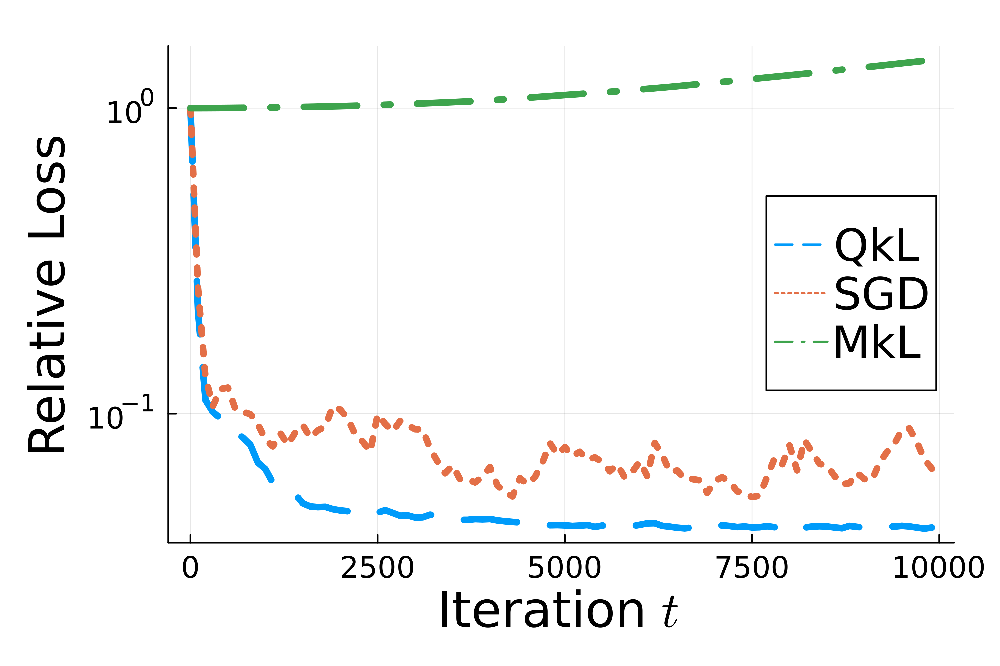

"/Users/jamiehaddock/Dropbox/RESEARCH/COLLAB CorruptSGD/code/JuliaCode/figs/hingeloss_loss_1percoutlier.png"

In [10]:
# what happens if we use SGD instead of QkL-SGD?

# run SGD on problem defined only by good set
Gsgd_x, loss_hist, loss_hist, indices, O_allowed = qklsgd_hingeloss(x0, D_aug[:,Gset], t[Gset], length(Gset), 1.0, 1:length(Gset), [], iters=100000)

# Train model with SGD
sgd_x, G_loss_hist, O_loss_hist, indices, O_allowed, sgd_error = qklsgd_hingeloss(x0, D_aug, t, 200, 1.0, Gset, Oset, iters=10000, xstar = Gsgd_x)

# Train model with QkL-SGD
qklsgd_x, qkl_G_loss_hist, O_loss_hist, indices, O_allowed, qklsgd_error = qklsgd_hingeloss(x0, D_aug, t, 200, 0.99, Gset, Oset, iters=10000, xstar = Gsgd_x)

# Train model with mkL-SGD
mklsgd_x, mkl_G_loss_hist, O_loss_hist, indices, O_allowed, mklsgd_error = mklsgd_hingeloss(x0, D_aug, t, 200, Gset, Oset, iters=10000, xstar = Gsgd_x)

iters = 1:10000

# Plot loss curve
# Main plots (hidden from legend)
p = plot(iters[1:100:end], qkl_G_loss_hist[1:100:end]/qkl_G_loss_hist[1],
     label=nothing, linestyle=:dash, xlabel=L"Iteration $t$",
     ylabel="Relative Loss", lw=4, dpi=500,
     margin=5mm, yscale=:log10,legend=(0.85,0.6))

plot!(iters[1:100:end], G_loss_hist[1:100:end]/G_loss_hist[1],
      label=nothing, linestyle=:dot, lw=4, yscale=:log10)

plot!(iters[1:100:end], mkl_G_loss_hist[1:100:end]/mkl_G_loss_hist[1],
      label=nothing, linestyle=:dashdot, lw=4, yscale=:log10)

# Burner plots (only for legend, thin lines)
plot!([NaN], [NaN], label="QkL", linestyle=:dash, lw=0.6, color=1)
plot!([NaN], [NaN], label="SGD", linestyle=:dot, lw=0.6, color=2)
plot!([NaN], [NaN], label="MkL", linestyle=:dashdot, lw=0.6, color=3)

display(p)
savefig("figs/hingeloss_loss_1percoutlier.png")

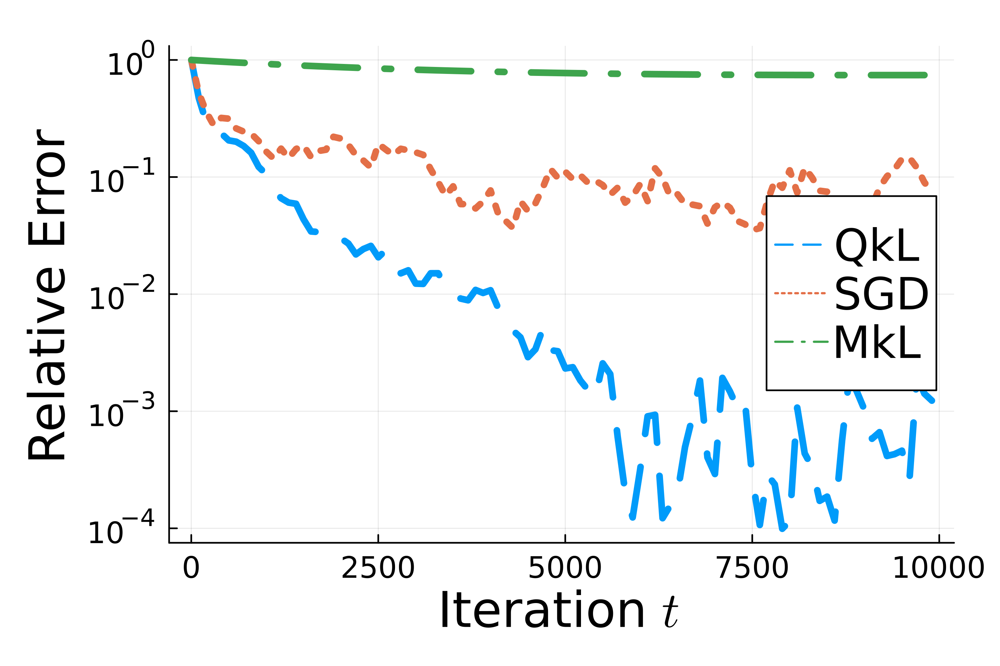

"/Users/jamiehaddock/Dropbox/RESEARCH/COLLAB CorruptSGD/code/JuliaCode/figs/hingeloss_error_1percoutlier.png"

In [11]:
iters = 1:10000

# Plot error curve
p = plot(iters[1:100:end],qklsgd_error[1:100:end]/qklsgd_error[1], xlabel=L"Iteration $t$", ylabel="Relative Error", lw=4,yscale=:log10, dpi=500,margin=5mm, linestyle=:dash, label=nothing,legend=(0.85,0.6))
plot!(iters[1:100:end],sgd_error[1:100:end]/sgd_error[1], linestyle=:dot, lw=4,yscale=:log10, label=nothing)
plot!(iters[1:100:end],mklsgd_error[1:100:end]/mklsgd_error[1], linestyle=:dashdot, lw=4,yscale=:log10, label=nothing)

# Burner plots (only for legend, thin lines)
plot!([NaN], [NaN], label="QkL", linestyle=:dash, lw=0.6, color=1)
plot!([NaN], [NaN], label="SGD", linestyle=:dot, lw=0.6, color=2)
plot!([NaN], [NaN], label="MkL", linestyle=:dashdot, lw=0.6, color=3)
display(p)
savefig("figs/hingeloss_error_1percoutlier.png")

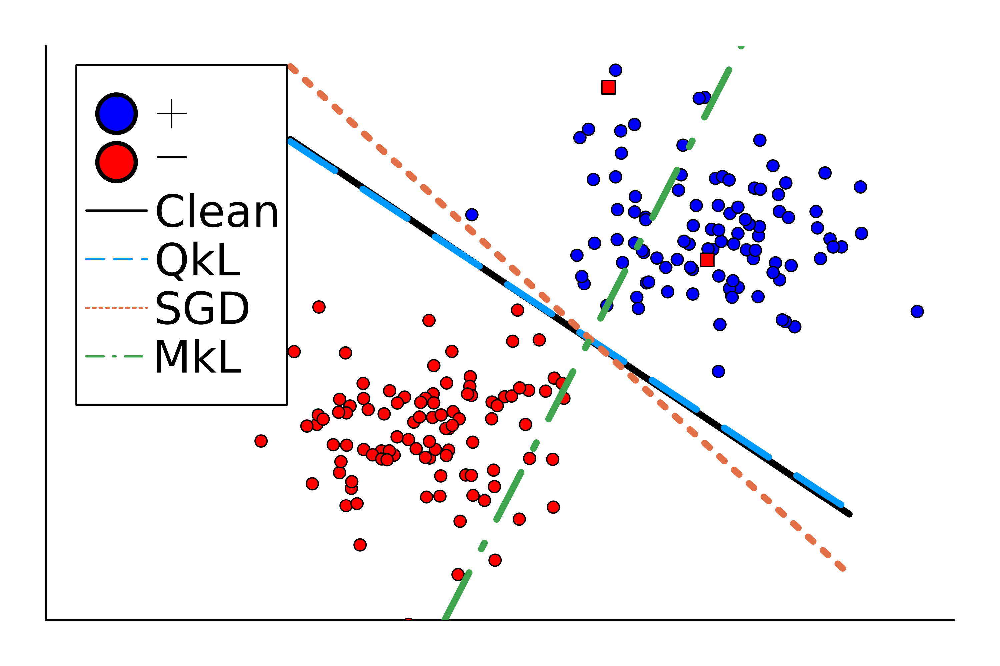

"/Users/jamiehaddock/Dropbox/RESEARCH/COLLAB CorruptSGD/code/JuliaCode/figs/hingeloss_viz_1percoutlier.png"

In [12]:
# Visualize data and decision boundary
begin
	dcomp1 = D_aug[2, :]
	dcomp2 = D_aug[3, :]
	t_plot = t

	p = scatter(dcomp1[t_plot.==1], dcomp2[t_plot.==1], marker=:circle, label=L"+", color=:blue, legend=:topleft,ticks=false, dpi=500,margin=5mm)
	scatter!(dcomp1[t_plot.==-1], dcomp2[t_plot.==-1], marker=:circle, label=L"-", color=:red)
	scatter!(dcomp1[Oset], dcomp2[Oset], marker=:square, label=nothing, color=:red)

	# Plot decision boundary: w0 + w1*x1 + w2*x2 = 0 --> x2 = -(w0 + w1*x1)/w2
	range = -4:0.1:4
	true_boundary = -(Gsgd_x[1] .+ Gsgd_x[2]*dcomp1_range) ./ Gsgd_x[3]
	plot!(range,true_boundary, color=:black, lw=4,label=nothing)
	qklsgd_boundary = -(qklsgd_x[1] .+ qklsgd_x[2]*dcomp1_range) ./ qklsgd_x[3]
	plot!(range, qklsgd_boundary, linestyle=:dash, lw=4, color=1,label=nothing)
	sgd_boundary = -(sgd_x[1] .+ sgd_x[2]*dcomp1_range) ./ sgd_x[3]
	plot!(range, sgd_boundary, linestyle=:dot, lw=4, color=2,label=nothing)
	mklsgd_boundary = -(mklsgd_x[1] .+ mklsgd_x[2]*dcomp1_range) ./ mklsgd_x[3]
	plot!(range, mklsgd_boundary, linestyle=:dashdot, lw=4, color=3,label=nothing)
	# Burner plots (only for legend, thin lines)
	plot!([NaN], [NaN], label="Clean", linestyle=:solid, lw=0.6, color=:black)
	plot!([NaN], [NaN], label="QkL", linestyle=:dash, lw=0.6, color=1)
	plot!([NaN], [NaN], label="SGD", linestyle=:dot, lw=0.6, color=2)
	plot!([NaN], [NaN], label="MkL", linestyle=:dashdot, lw=0.6, color=3)

	xlims!(-7.5,5.5)
	ylims!(-5.5,5.5)

	#title!("1% Outliers")
	display(p)
	savefig("figs/hingeloss_viz_1percoutlier.png")
end

# Outlier example -- $\beta = 0.1$, $q = 0.9$, $\alpha = 1$, outliers randomly selected from both classes

In [13]:
# Generate linearly separable 2D data with $\beta = 0.1$ fraction mislabelled
begin
    # reset labels
	t = vcat(ones(class_size), -ones(class_size))  # Labels: 1 for positive, -1 for negative

	β = 0.1
	Oset = rand(1:n_samples, Int(β*n_samples))  # Randomly select Oset indices
    t[Oset] .= -t[Oset]  # Flip labels
    Gset = setdiff(1:n_samples, Oset);  # Gset is the complement of Oset
end


181-element Vector{Int64}:
   1
   3
   5
   6
   7
   8
   9
  10
  11
  12
  15
  16
  17
   ⋮
 189
 190
 191
 192
 193
 194
 195
 196
 197
 198
 199
 200

(181,)
(200,)
(180,)
(28,)


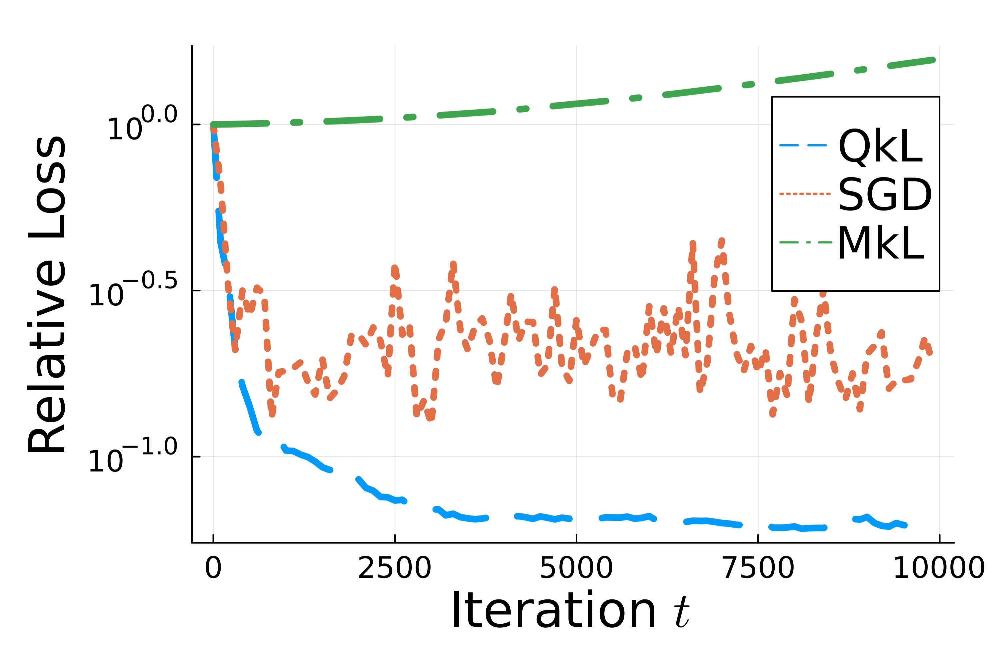

"/Users/jamiehaddock/Dropbox/RESEARCH/COLLAB CorruptSGD/code/JuliaCode/figs/hingeloss_loss_10percoutlier2class.png"

In [14]:
# what happens if we use SGD instead of QkL-SGD?

# run SGD on problem defined only by good set
Gsgd_x, loss_hist, loss_hist, indices, O_allowed = qklsgd_hingeloss(x0, D_aug[:,Gset], t[Gset], length(Gset), 1.0, 1:length(Gset), [], iters=100000)

# Train model with SGD
sgd_x, G_loss_hist, O_loss_hist, indices, O_allowed, sgd_error = qklsgd_hingeloss(x0, D_aug, t, 200, 1.0, Gset, Oset, iters=10000, xstar = Gsgd_x)

# Train model with QkL-SGD
qklsgd_x, qkl_G_loss_hist, O_loss_hist, indices, O_allowed, qklsgd_error = qklsgd_hingeloss(x0, D_aug, t, 200, 0.9, Gset, Oset, iters=10000, xstar = Gsgd_x)

# Train model with mkL-SGD
mklsgd_x, mkl_G_loss_hist, O_loss_hist, indices, O_allowed, mklsgd_error = mklsgd_hingeloss(x0, D_aug, t, 200, Gset, Oset, iters=10000, xstar = Gsgd_x)

iters = 1:10000

# Plot loss curve
# Main plots (hidden from legend)
p = plot(iters[1:100:end], qkl_G_loss_hist[1:100:end]/qkl_G_loss_hist[1],
     label=nothing, linestyle=:dash, xlabel=L"Iteration $t$",
     ylabel="Relative Loss", lw=4, dpi=500,
     margin=5mm, yscale=:log10,legend=(0.85,0.8))

plot!(iters[1:100:end], G_loss_hist[1:100:end]/G_loss_hist[1],
      label=nothing, linestyle=:dot, lw=4, yscale=:log10)

plot!(iters[1:100:end], mkl_G_loss_hist[1:100:end]/mkl_G_loss_hist[1],
      label=nothing, linestyle=:dashdot, lw=4, yscale=:log10)

# Burner plots (only for legend, thin lines)
plot!([NaN], [NaN], label="QkL", linestyle=:dash, lw=0.6, color=1)
plot!([NaN], [NaN], label="SGD", linestyle=:dot, lw=0.6, color=2)
plot!([NaN], [NaN], label="MkL", linestyle=:dashdot, lw=0.6, color=3)
display(p)
savefig("figs/hingeloss_loss_10percoutlier2class.png")

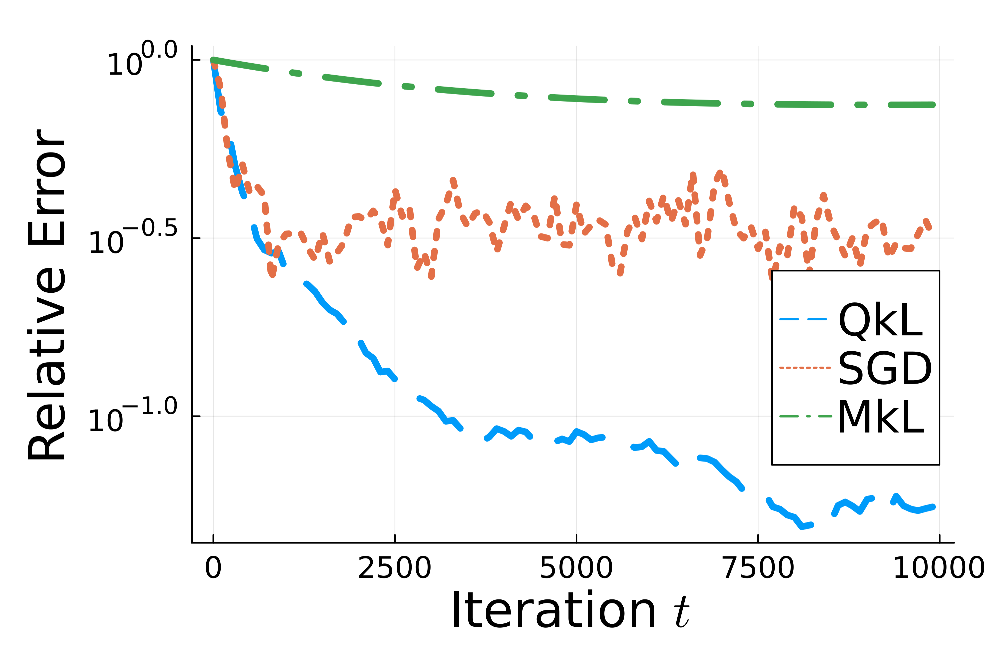

"/Users/jamiehaddock/Dropbox/RESEARCH/COLLAB CorruptSGD/code/JuliaCode/figs/hingeloss_error_10percoutlier2class.png"

In [15]:
iters = 1:10000

# Plot error curve
p = plot(iters[1:100:end],qklsgd_error[1:100:end]/qklsgd_error[1], xlabel=L"Iteration $t$", ylabel="Relative Error", lw=4,yscale=:log10, dpi=500,margin=5mm, linestyle=:dash, label=nothing,legend=(0.85,0.45))
plot!(iters[1:100:end],sgd_error[1:100:end]/sgd_error[1], linestyle=:dot, lw=4,yscale=:log10, label=nothing)
plot!(iters[1:100:end],mklsgd_error[1:100:end]/mklsgd_error[1], linestyle=:dashdot, lw=4,yscale=:log10, label=nothing)

# Burner plots (only for legend, thin lines)
plot!([NaN], [NaN], label="QkL", linestyle=:dash, lw=0.6, color=1)
plot!([NaN], [NaN], label="SGD", linestyle=:dot, lw=0.6, color=2)
plot!([NaN], [NaN], label="MkL", linestyle=:dashdot, lw=0.6, color=3)
display(p)
savefig("figs/hingeloss_error_10percoutlier2class.png")

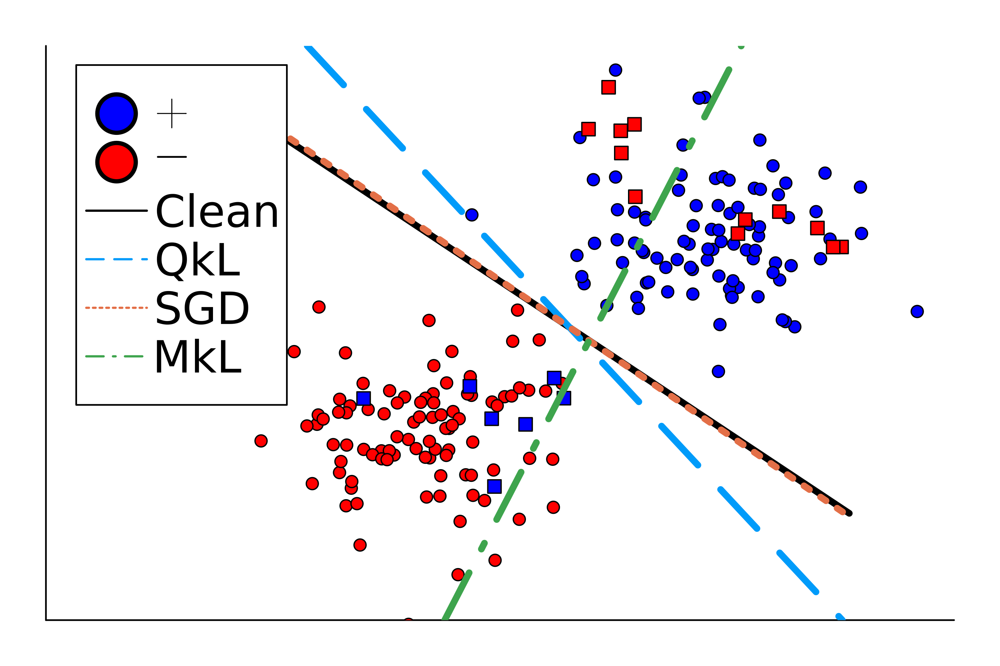

"/Users/jamiehaddock/Dropbox/RESEARCH/COLLAB CorruptSGD/code/JuliaCode/figs/hingeloss_viz_10percoutlier2class.png"

In [16]:
# Visualize data and decision boundary
begin
	dcomp1 = D_aug[2, :]
	dcomp2 = D_aug[3, :]
	t_plot = t

	p = scatter(dcomp1[t_plot.==1], dcomp2[t_plot.==1], marker=:circle, label=L"+", color=:blue, legend=:topleft,ticks=false, dpi=500,margin=5mm)
	scatter!(dcomp1[t_plot.==-1], dcomp2[t_plot.==-1], marker=:circle, label=L"-", color=:red)

	O_pos = intersect(Oset, findall(t_plot .== 1))
	O_neg = intersect(Oset, findall(t_plot .== -1))
	scatter!(dcomp1[O_pos], dcomp2[O_pos], marker=:square, label=nothing, color=:blue)
	scatter!(dcomp1[O_neg], dcomp2[O_neg], marker=:square, label=nothing, color=:red)

	# Plot decision boundary: w0 + w1*x1 + w2*x2 = 0 --> x2 = -(w0 + w1*x1)/w2
	range = -4:0.1:4
	true_boundary = -(Gsgd_x[1] .+ Gsgd_x[2]*dcomp1_range) ./ Gsgd_x[3]
	plot!(range,true_boundary, lw=4, color=:black,label=nothing)
	qklsgd_boundary = -(qklsgd_x[1] .+ qklsgd_x[2]*dcomp1_range) ./ qklsgd_x[3]
	plot!(range, qklsgd_boundary, lw=4, linestyle=:dash,color=1,label=nothing)
	sgd_boundary = -(sgd_x[1] .+ sgd_x[2]*dcomp1_range) ./ sgd_x[3]
	plot!(range, sgd_boundary, lw=4, linestyle=:dot,color=2,label=nothing)
	mklsgd_boundary = -(mklsgd_x[1] .+ mklsgd_x[2]*dcomp1_range) ./ mklsgd_x[3]
	plot!(range, mklsgd_boundary, linestyle=:dashdot, lw=4, color=3,label=nothing)

	# Burner plots (only for legend, thin lines)
	plot!([NaN], [NaN], label="Clean", linestyle=:solid, lw=0.6, color=:black)
	plot!([NaN], [NaN], label="QkL", linestyle=:dash, lw=0.6, color=1)
	plot!([NaN], [NaN], label="SGD", linestyle=:dot, lw=0.6, color=2)
	plot!([NaN], [NaN], label="MkL", linestyle=:dashdot, lw=0.6, color=3)

	xlims!(-7.5,5.5)
	ylims!(-5.5,5.5)

	#title!("10% Outliers")
	display(p)
	savefig("figs/hingeloss_viz_10percoutlier2class.png")
end

# Outlier example -- $\beta = 0.1$, $q = 0.9$, $\alpha = 1$, outliers randomly selected from one class

In [17]:
# Generate linearly separable 2D data with $\beta = 0.1$ fraction mislabelled
begin
    # reset labels
	t = vcat(ones(class_size), -ones(class_size))  # Labels: 1 for positive, -1 for negative

	β = 0.1
	Oset = rand(1:Int(n_samples/2), Int(β*n_samples))  # Randomly select Oset indices
    t[Oset] .= -t[Oset]  # Flip labels
    Gset = setdiff(1:n_samples, Oset);  # Gset is the complement of Oset
end

182-element Vector{Int64}:
   1
   2
   3
   4
   5
   6
   7
   8
   9
  10
  11
  12
  13
   ⋮
 189
 190
 191
 192
 193
 194
 195
 196
 197
 198
 199
 200

(182,)
(200,)
(180,)
(31,)


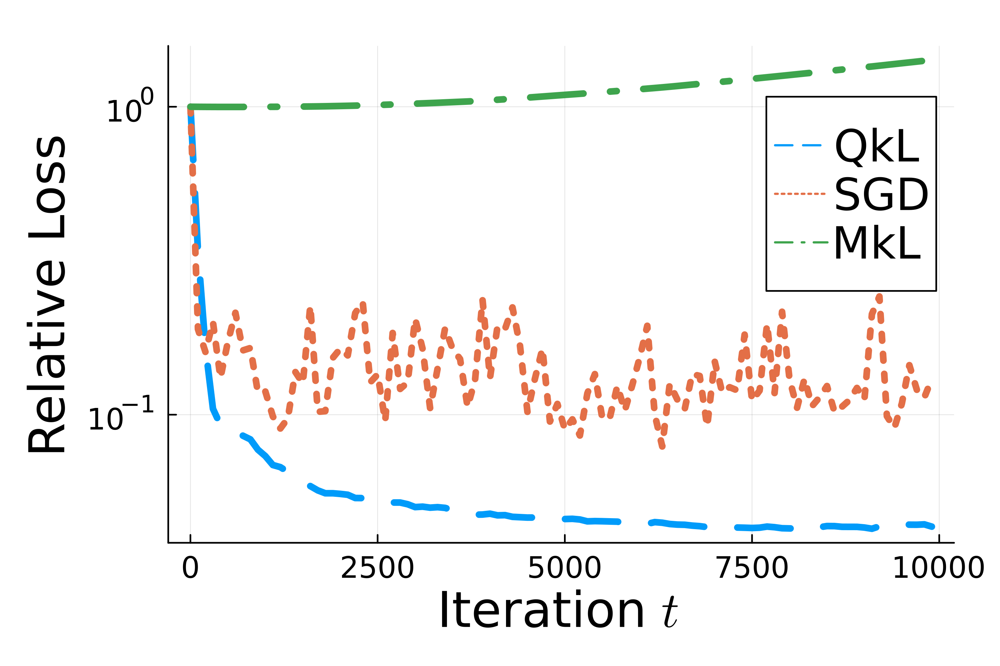

"/Users/jamiehaddock/Dropbox/RESEARCH/COLLAB CorruptSGD/code/JuliaCode/figs/hingeloss_loss_10percoutlier1class.png"

In [18]:
# what happens if we use SGD instead of QkL-SGD?

# run SGD on problem defined only by good set
Gsgd_x, loss_hist, loss_hist, indices, O_allowed = qklsgd_hingeloss(x0, D_aug[:,Gset], t[Gset], length(Gset), 1.0, 1:length(Gset), [], iters=100000)

# Train model with SGD
sgd_x, G_loss_hist, O_loss_hist, indices, O_allowed, sgd_error = qklsgd_hingeloss(x0, D_aug, t, 200, 1.0, Gset, Oset, iters=10000, xstar = Gsgd_x)

# Train model with QkL-SGD
qklsgd_x, qkl_G_loss_hist, O_loss_hist, indices, O_allowed, qklsgd_error = qklsgd_hingeloss(x0, D_aug, t, 200, 0.9, Gset, Oset, iters=10000, xstar = Gsgd_x)

# Train model with mkL-SGD
mklsgd_x, mkl_G_loss_hist, O_loss_hist, indices, O_allowed, mklsgd_error = mklsgd_hingeloss(x0, D_aug, t, 200, Gset, Oset, iters=10000, xstar = Gsgd_x)

iters = 1:10000

# Plot loss curve
# Main plots (hidden from legend)
p = plot(iters[1:100:end], qkl_G_loss_hist[1:100:end]/qkl_G_loss_hist[1],
     label=nothing, linestyle=:dash, xlabel=L"Iteration $t$",
     ylabel="Relative Loss", lw=4, dpi=500,
     margin=5mm, yscale=:log10,legend=(0.85,0.8))

plot!(iters[1:100:end], G_loss_hist[1:100:end]/G_loss_hist[1],
      label=nothing, linestyle=:dot, lw=4, yscale=:log10)

plot!(iters[1:100:end], mkl_G_loss_hist[1:100:end]/mkl_G_loss_hist[1],
      label=nothing, linestyle=:dashdot, lw=4, yscale=:log10)

# Burner plots (only for legend, thin lines)
plot!([NaN], [NaN], label="QkL", linestyle=:dash, lw=0.6, color=1)
plot!([NaN], [NaN], label="SGD", linestyle=:dot, lw=0.6, color=2)
plot!([NaN], [NaN], label="MkL", linestyle=:dashdot, lw=0.6, color=3)
display(p)
savefig("figs/hingeloss_loss_10percoutlier1class.png")

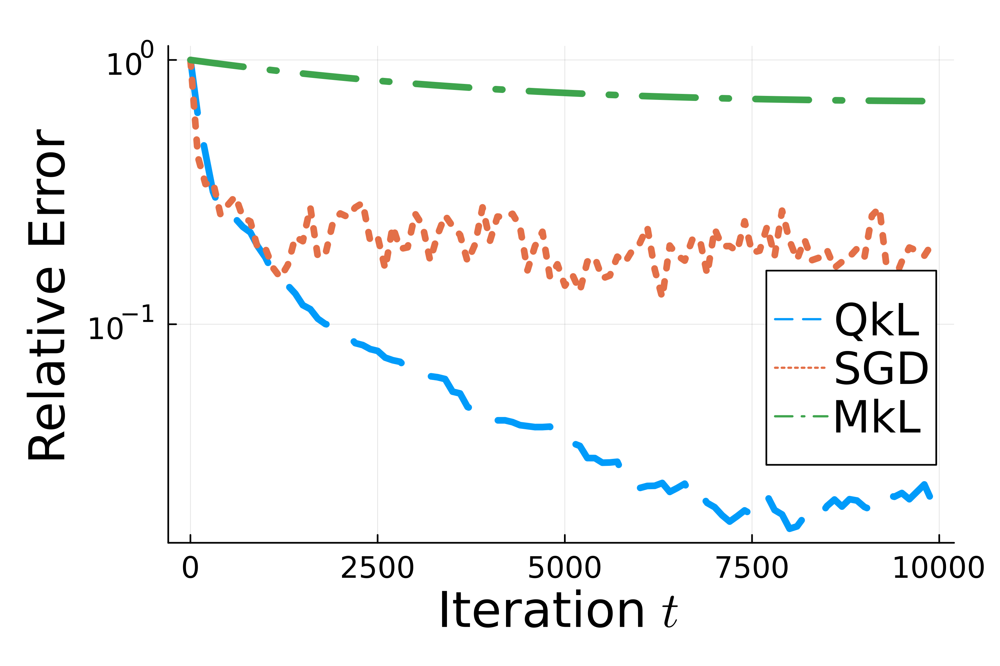

"/Users/jamiehaddock/Dropbox/RESEARCH/COLLAB CorruptSGD/code/JuliaCode/figs/hingeloss_error_10percoutlier1class.png"

In [19]:
iters = 1:10000

# Plot error curve
p = plot(iters[1:100:end],qklsgd_error[1:100:end]/qklsgd_error[1], xlabel=L"Iteration $t$", ylabel="Relative Error", lw=4,yscale=:log10, dpi=500,margin=5mm, linestyle=:dash, label=nothing,legend=(0.85,0.45))
plot!(iters[1:100:end],sgd_error[1:100:end]/sgd_error[1], linestyle=:dot, lw=4,yscale=:log10, label=nothing)
plot!(iters[1:100:end],mklsgd_error[1:100:end]/mklsgd_error[1], linestyle=:dashdot, lw=4,yscale=:log10, label=nothing)

# Burner plots (only for legend, thin lines)
plot!([NaN], [NaN], label="QkL", linestyle=:dash, lw=0.6, color=1)
plot!([NaN], [NaN], label="SGD", linestyle=:dot, lw=0.6, color=2)
plot!([NaN], [NaN], label="MkL", linestyle=:dashdot, lw=0.6, color=3)
display(p)
savefig("figs/hingeloss_error_10percoutlier1class.png")

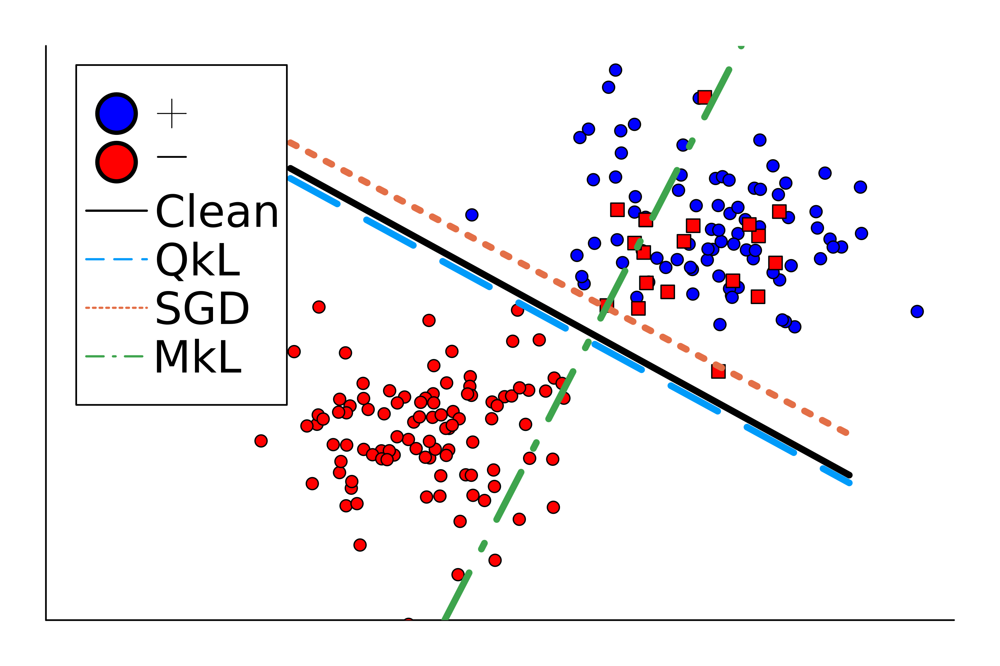

"/Users/jamiehaddock/Dropbox/RESEARCH/COLLAB CorruptSGD/code/JuliaCode/figs/hingeloss_viz_10percoutlier1class.png"

In [20]:
# Visualize data and decision boundary
begin
	dcomp1 = D_aug[2, :]
	dcomp2 = D_aug[3, :]
	t_plot = t

	p = scatter(dcomp1[t_plot.==1], dcomp2[t_plot.==1], marker=:circle, label=L"+", color=:blue, legend=:topleft,ticks=false, dpi=500,margin=5mm)
	scatter!(dcomp1[t_plot.==-1], dcomp2[t_plot.==-1], marker=:circle, label=L"-", color=:red)
	scatter!(dcomp1[Oset], dcomp2[Oset], marker=:square, label=nothing, color=:red)

	# Plot decision boundary: w0 + w1*x1 + w2*x2 = 0 --> x2 = -(w0 + w1*x1)/w2
	range = -4:0.1:4
	true_boundary = -(Gsgd_x[1] .+ Gsgd_x[2]*dcomp1_range) ./ Gsgd_x[3]
	plot!(range,true_boundary, lw=4, color=:black,label=nothing)
	qklsgd_boundary = -(qklsgd_x[1] .+ qklsgd_x[2]*dcomp1_range) ./ qklsgd_x[3]
	plot!(range, qklsgd_boundary, lw=4, linestyle=:dash,color=1,label=nothing)
	sgd_boundary = -(sgd_x[1] .+ sgd_x[2]*dcomp1_range) ./ sgd_x[3]
	plot!(range, sgd_boundary, lw=4, linestyle=:dot,color=2,label=nothing)
	mklsgd_boundary = -(mklsgd_x[1] .+ mklsgd_x[2]*dcomp1_range) ./ mklsgd_x[3]
	plot!(range, mklsgd_boundary, linestyle=:dashdot, lw=4, color=3,label=nothing)

	# Burner plots (only for legend, thin lines)
	plot!([NaN], [NaN], label="Clean", linestyle=:solid, lw=0.6, color=:black)
	plot!([NaN], [NaN], label="QkL", linestyle=:dash, lw=0.6, color=1)
	plot!([NaN], [NaN], label="SGD", linestyle=:dot, lw=0.6, color=2)
	plot!([NaN], [NaN], label="MkL", linestyle=:dashdot, lw=0.6, color=3)

	xlims!(-7.5,5.5)
	ylims!(-5.5,5.5)

	#title!("10% Outliers")
	display(p)
	savefig("figs/hingeloss_viz_10percoutlier1class.png")
end

# Outlier example -- $\beta = 0.05$, $q = 0.95$, $\alpha = 1$, outliers randomly selected from both classes

In [21]:
# Generate linearly separable 2D data with $\beta = 0.1$ fraction mislabelled
begin
    # reset labels
	t = vcat(ones(class_size), -ones(class_size))  # Labels: 1 for positive, -1 for negative

	β = 0.05
	Oset = rand(1:n_samples, Int(β*n_samples))  # Randomly select Oset indices
    t[Oset] .= -t[Oset]  # Flip labels
    Gset = setdiff(1:n_samples, Oset);  # Gset is the complement of Oset
end


190-element Vector{Int64}:
   1
   2
   3
   4
   5
   6
   7
   8
   9
  10
  11
  12
  13
   ⋮
 189
 190
 191
 192
 193
 194
 195
 196
 197
 198
 199
 200

(190,)
(200,)
(190,)
(31,)


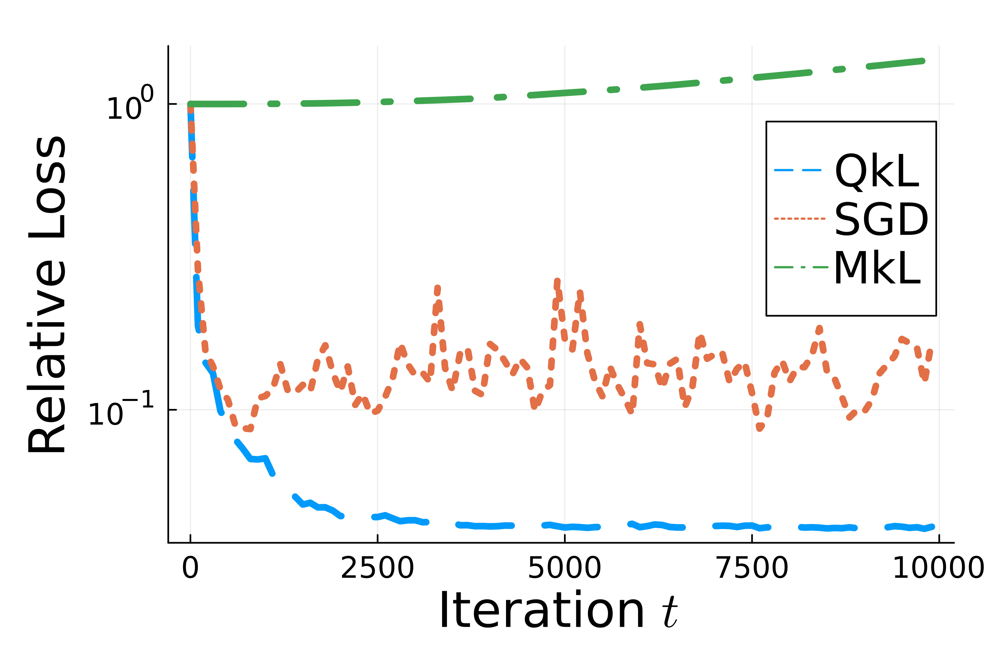

"/Users/jamiehaddock/Dropbox/RESEARCH/COLLAB CorruptSGD/code/JuliaCode/figs/hingeloss_loss_5percoutlier2class.png"

In [22]:
# what happens if we use SGD instead of QkL-SGD?

# run SGD on problem defined only by good set
Gsgd_x, loss_hist, loss_hist, indices, O_allowed = qklsgd_hingeloss(x0, D_aug[:,Gset], t[Gset], length(Gset), 1.0, 1:length(Gset), [], iters=100000)

# Train model with SGD
sgd_x, G_loss_hist, O_loss_hist, indices, O_allowed, sgd_error = qklsgd_hingeloss(x0, D_aug, t, 200, 1.0, Gset, Oset, iters=10000, xstar = Gsgd_x)

# Train model with QkL-SGD
qklsgd_x, qkl_G_loss_hist, O_loss_hist, indices, O_allowed, qklsgd_error = qklsgd_hingeloss(x0, D_aug, t, 200, 0.95, Gset, Oset, iters=10000, xstar = Gsgd_x)

# Train model with mkL-SGD
mklsgd_x, mkl_G_loss_hist, O_loss_hist, indices, O_allowed, mklsgd_error = mklsgd_hingeloss(x0, D_aug, t, 200, Gset, Oset, iters=10000, xstar = Gsgd_x)

iters = 1:10000

# Plot loss curve
# Main plots (hidden from legend)
p = plot(iters[1:100:end], qkl_G_loss_hist[1:100:end]/qkl_G_loss_hist[1],
     label=nothing, linestyle=:dash, xlabel=L"Iteration $t$",
     ylabel="Relative Loss", lw=4, dpi=500,
     margin=5mm, yscale=:log10,legend=(0.85,0.75))

plot!(iters[1:100:end], G_loss_hist[1:100:end]/G_loss_hist[1],
      label=nothing, linestyle=:dot, lw=4, yscale=:log10)

plot!(iters[1:100:end], mkl_G_loss_hist[1:100:end]/mkl_G_loss_hist[1],
      label=nothing, linestyle=:dashdot, lw=4, yscale=:log10)

# Burner plots (only for legend, thin lines)
plot!([NaN], [NaN], label="QkL", linestyle=:dash, lw=0.6, color=1)
plot!([NaN], [NaN], label="SGD", linestyle=:dot, lw=0.6, color=2)
plot!([NaN], [NaN], label="MkL", linestyle=:dashdot, lw=0.6, color=3)
display(p)
savefig("figs/hingeloss_loss_5percoutlier2class.png")

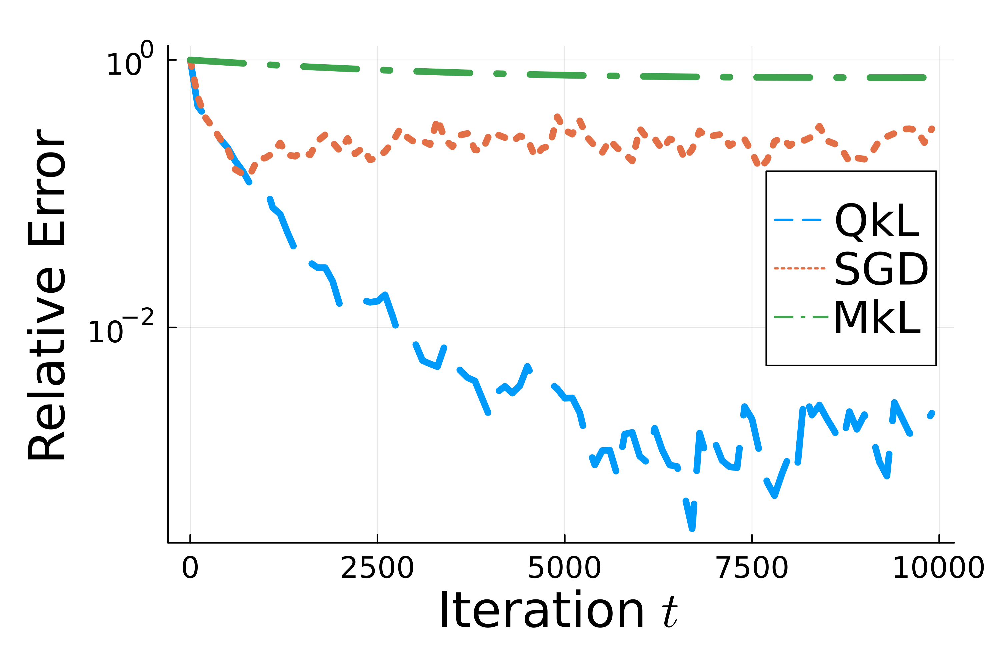

"/Users/jamiehaddock/Dropbox/RESEARCH/COLLAB CorruptSGD/code/JuliaCode/figs/hingeloss_error_5percoutlier2class.png"

In [23]:
iters = 1:10000

# Plot error curve
p = plot(iters[1:100:end],qklsgd_error[1:100:end]/qklsgd_error[1], xlabel=L"Iteration $t$", ylabel="Relative Error", lw=4,yscale=:log10, dpi=500,margin=5mm, linestyle=:dash, label=nothing,legend=(0.85,0.65))
plot!(iters[1:100:end],sgd_error[1:100:end]/sgd_error[1], linestyle=:dot, lw=4,yscale=:log10, label=nothing)
plot!(iters[1:100:end],mklsgd_error[1:100:end]/mklsgd_error[1], linestyle=:dashdot, lw=4,yscale=:log10, label=nothing)

# Burner plots (only for legend, thin lines)
plot!([NaN], [NaN], label="QkL", linestyle=:dash, lw=0.6, color=1)
plot!([NaN], [NaN], label="SGD", linestyle=:dot, lw=0.6, color=2)
plot!([NaN], [NaN], label="MkL", linestyle=:dashdot, lw=0.6, color=3)
display(p)
savefig("figs/hingeloss_error_5percoutlier2class.png")

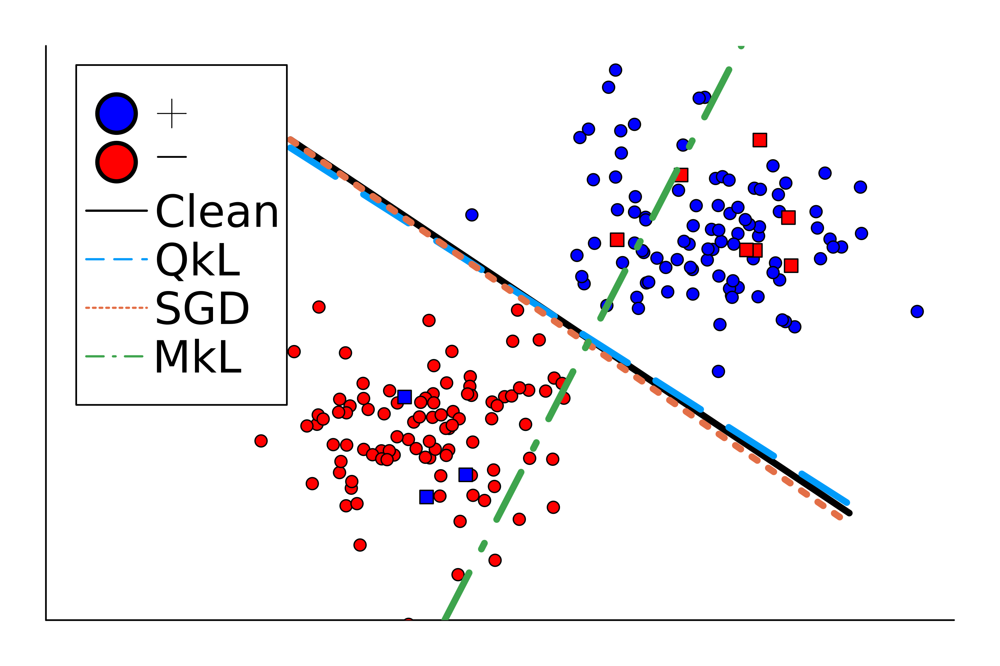

"/Users/jamiehaddock/Dropbox/RESEARCH/COLLAB CorruptSGD/code/JuliaCode/figs/hingeloss_viz_5percoutlier2class.png"

In [24]:
# Visualize data and decision boundary
begin
	dcomp1 = D_aug[2, :]
	dcomp2 = D_aug[3, :]
	t_plot = t

	p = scatter(dcomp1[t_plot.==1], dcomp2[t_plot.==1], marker=:circle, label=L"+", color=:blue, legend=:topleft,ticks=false, dpi=500,margin=5mm)
	scatter!(dcomp1[t_plot.==-1], dcomp2[t_plot.==-1], marker=:circle, label=L"-", color=:red)

	O_pos = intersect(Oset, findall(t_plot .== 1))
	O_neg = intersect(Oset, findall(t_plot .== -1))
	scatter!(dcomp1[O_pos], dcomp2[O_pos], marker=:square, label=nothing, color=:blue)
	scatter!(dcomp1[O_neg], dcomp2[O_neg], marker=:square, label=nothing, color=:red)

	# Plot decision boundary: w0 + w1*x1 + w2*x2 = 0 --> x2 = -(w0 + w1*x1)/w2
	range = -4:0.1:4
	true_boundary = -(Gsgd_x[1] .+ Gsgd_x[2]*dcomp1_range) ./ Gsgd_x[3]
	plot!(range,true_boundary, lw=4, color=:black,label=nothing)
	qklsgd_boundary = -(qklsgd_x[1] .+ qklsgd_x[2]*dcomp1_range) ./ qklsgd_x[3]
	plot!(range, qklsgd_boundary, lw=4, linestyle=:dash,color=1,label=nothing)
	sgd_boundary = -(sgd_x[1] .+ sgd_x[2]*dcomp1_range) ./ sgd_x[3]
	plot!(range, sgd_boundary, lw=4, linestyle=:dot,color=2,label=nothing)
	mklsgd_boundary = -(mklsgd_x[1] .+ mklsgd_x[2]*dcomp1_range) ./ mklsgd_x[3]
	plot!(range, mklsgd_boundary, linestyle=:dashdot, lw=4, color=3,label=nothing)

	# Burner plots (only for legend, thin lines)
	plot!([NaN], [NaN], label="Clean", linestyle=:solid, lw=0.6, color=:black)
	plot!([NaN], [NaN], label="QkL", linestyle=:dash, lw=0.6, color=1)
	plot!([NaN], [NaN], label="SGD", linestyle=:dot, lw=0.6, color=2)
	plot!([NaN], [NaN], label="MkL", linestyle=:dashdot, lw=0.6, color=3)

	xlims!(-7.5,5.5)
	ylims!(-5.5,5.5)

	#title!("10% Outliers")
	display(p)
	savefig("figs/hingeloss_viz_5percoutlier2class.png")
end

# Outlier example -- $\beta = 0.05$, $q = 0.95$, $\alpha = 1$, outliers randomly selected from one class

In [25]:
# Generate linearly separable 2D data with $\beta = 0.1$ fraction mislabelled
begin
    # reset labels
	t = vcat(ones(class_size), -ones(class_size))  # Labels: 1 for positive, -1 for negative

	β = 0.05
	Oset = rand(1:Int(n_samples/2), Int(β*n_samples))  # Randomly select Oset indices
    t[Oset] .= -t[Oset]  # Flip labels
    Gset = setdiff(1:n_samples, Oset);  # Gset is the complement of Oset
end

191-element Vector{Int64}:
   1
   2
   3
   4
   5
   6
   7
   8
   9
  10
  11
  12
  13
   ⋮
 189
 190
 191
 192
 193
 194
 195
 196
 197
 198
 199
 200

(191,)
(200,)
(190,)
(31,)


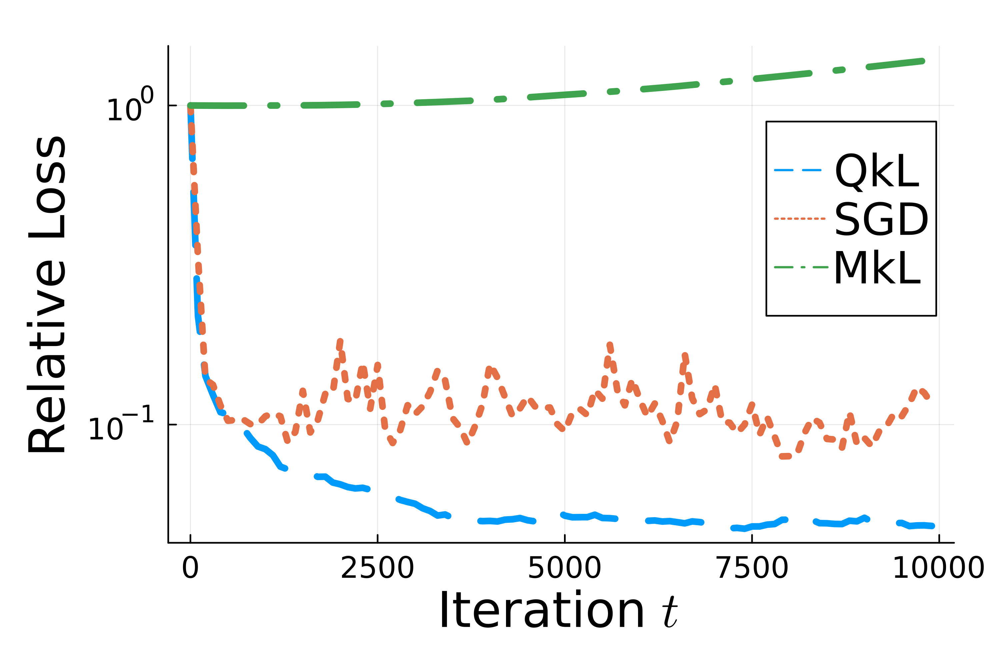

"/Users/jamiehaddock/Dropbox/RESEARCH/COLLAB CorruptSGD/code/JuliaCode/figs/hingeloss_loss_5percoutlier1class.png"

In [26]:
# what happens if we use SGD instead of QkL-SGD?

# run SGD on problem defined only by good set
Gsgd_x, loss_hist, loss_hist, indices, O_allowed = qklsgd_hingeloss(x0, D_aug[:,Gset], t[Gset], length(Gset), 1.0, 1:length(Gset), [], iters=100000)

# Train model with SGD
sgd_x, G_loss_hist, O_loss_hist, indices, O_allowed, sgd_error = qklsgd_hingeloss(x0, D_aug, t, 200, 1.0, Gset, Oset, iters=10000, xstar = Gsgd_x)

# Train model with QkL-SGD
qklsgd_x, qkl_G_loss_hist, O_loss_hist, indices, O_allowed, qklsgd_error = qklsgd_hingeloss(x0, D_aug, t, 200, 0.95, Gset, Oset, iters=10000, xstar = Gsgd_x)

# Train model with mkL-SGD
mklsgd_x, mkl_G_loss_hist, O_loss_hist, indices, O_allowed, mklsgd_error = mklsgd_hingeloss(x0, D_aug, t, 200, Gset, Oset, iters=10000, xstar = Gsgd_x)

iters = 1:10000

# Plot loss curve
# Main plots (hidden from legend)
p = plot(iters[1:100:end], qkl_G_loss_hist[1:100:end]/qkl_G_loss_hist[1],
     label=nothing, linestyle=:dash, xlabel=L"Iteration $t$",
     ylabel="Relative Loss", lw=4, dpi=500,
     margin=5mm, yscale=:log10, legend=(0.85,0.75))

plot!(iters[1:100:end], G_loss_hist[1:100:end]/G_loss_hist[1],
      label=nothing, linestyle=:dot, lw=4, yscale=:log10)

plot!(iters[1:100:end], mkl_G_loss_hist[1:100:end]/mkl_G_loss_hist[1],
      label=nothing, linestyle=:dashdot, lw=4, yscale=:log10)

# Burner plots (only for legend, thin lines)
plot!([NaN], [NaN], label="QkL", linestyle=:dash, lw=0.6, color=1)
plot!([NaN], [NaN], label="SGD", linestyle=:dot, lw=0.6, color=2)
plot!([NaN], [NaN], label="MkL", linestyle=:dashdot, lw=0.6, color=3)
display(p)
savefig("figs/hingeloss_loss_5percoutlier1class.png")

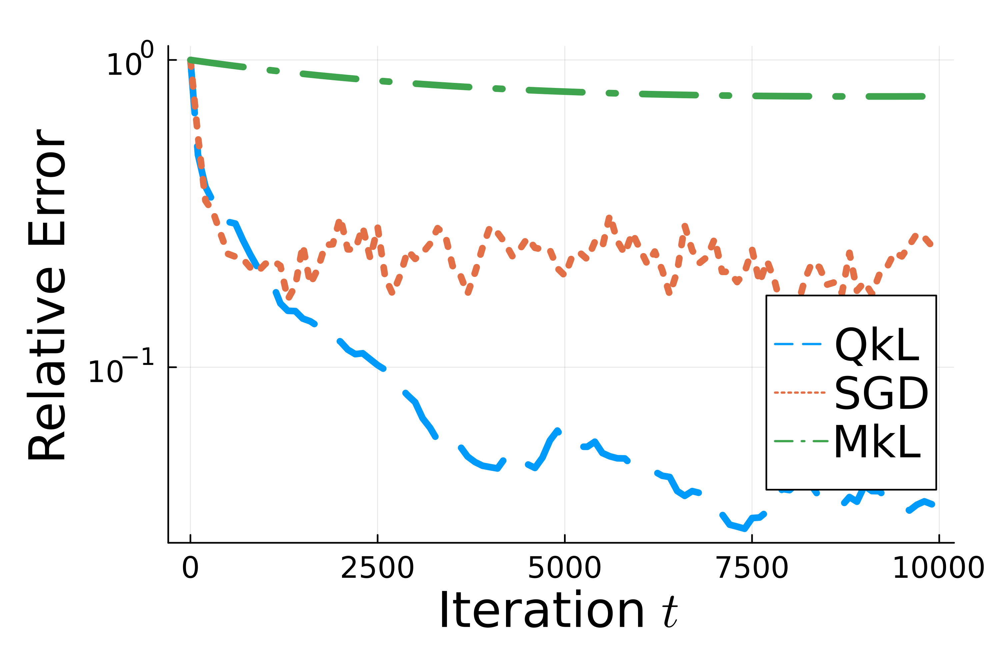

"/Users/jamiehaddock/Dropbox/RESEARCH/COLLAB CorruptSGD/code/JuliaCode/figs/hingeloss_error_5percoutlier1class.png"

In [27]:
iters = 1:10000

# Plot error curve
p = plot(iters[1:100:end],qklsgd_error[1:100:end]/qklsgd_error[1], xlabel=L"Iteration $t$", ylabel="Relative Error", lw=4,yscale=:log10, dpi=500,margin=5mm, linestyle=:dash, label=nothing,legend=(0.85,0.4))
plot!(iters[1:100:end],sgd_error[1:100:end]/sgd_error[1], linestyle=:dot, lw=4,yscale=:log10, label=nothing)
plot!(iters[1:100:end],mklsgd_error[1:100:end]/mklsgd_error[1], linestyle=:dashdot, lw=4,yscale=:log10, label=nothing)

# Burner plots (only for legend, thin lines)
plot!([NaN], [NaN], label="QkL", linestyle=:dash, lw=0.6, color=1)
plot!([NaN], [NaN], label="SGD", linestyle=:dot, lw=0.6, color=2)
plot!([NaN], [NaN], label="MkL", linestyle=:dashdot, lw=0.6, color=3)
display(p)
savefig("figs/hingeloss_error_5percoutlier1class.png")

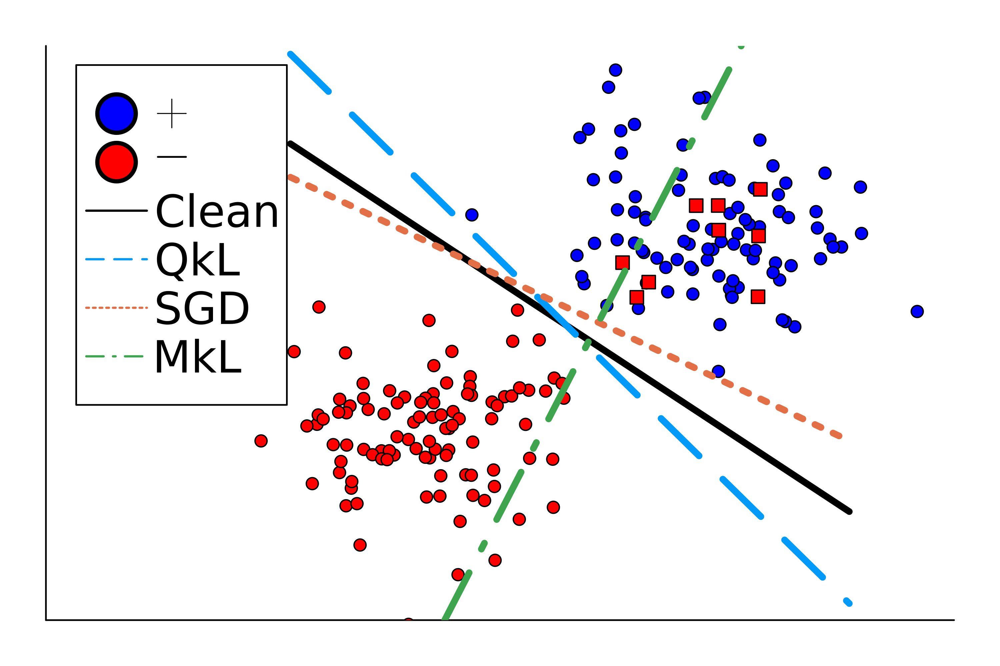

"/Users/jamiehaddock/Dropbox/RESEARCH/COLLAB CorruptSGD/code/JuliaCode/figs/hingeloss_viz_5percoutlier1class.png"

In [28]:
# Visualize data and decision boundary
begin
	dcomp1 = D_aug[2, :]
	dcomp2 = D_aug[3, :]
	t_plot = t

	p = scatter(dcomp1[t_plot.==1], dcomp2[t_plot.==1], marker=:circle, label=L"+", color=:blue, legend=:topleft,ticks=false, dpi=500,margin=5mm)
	scatter!(dcomp1[t_plot.==-1], dcomp2[t_plot.==-1], marker=:circle, label=L"-", color=:red)
	scatter!(dcomp1[Oset], dcomp2[Oset], marker=:square, label=nothing, color=:red)

	# Plot decision boundary: w0 + w1*x1 + w2*x2 = 0 --> x2 = -(w0 + w1*x1)/w2
	range = -4:0.1:4
	true_boundary = -(Gsgd_x[1] .+ Gsgd_x[2]*dcomp1_range) ./ Gsgd_x[3]
	plot!(range,true_boundary, lw=4, color=:black,label=nothing)
	qklsgd_boundary = -(qklsgd_x[1] .+ qklsgd_x[2]*dcomp1_range) ./ qklsgd_x[3]
	plot!(range, qklsgd_boundary, lw=4, linestyle=:dash,color=1,label=nothing)
	sgd_boundary = -(sgd_x[1] .+ sgd_x[2]*dcomp1_range) ./ sgd_x[3]
	plot!(range, sgd_boundary, lw=4, linestyle=:dot,color=2,label=nothing)
	mklsgd_boundary = -(mklsgd_x[1] .+ mklsgd_x[2]*dcomp1_range) ./ mklsgd_x[3]
	plot!(range, mklsgd_boundary, linestyle=:dashdot, lw=4, color=3,label=nothing)

	# Burner plots (only for legend, thin lines)
	plot!([NaN], [NaN], label="Clean", linestyle=:solid, lw=0.6, color=:black)
	plot!([NaN], [NaN], label="QkL", linestyle=:dash, lw=0.6, color=1)
	plot!([NaN], [NaN], label="SGD", linestyle=:dot, lw=0.6, color=2)
	plot!([NaN], [NaN], label="MkL", linestyle=:dashdot, lw=0.6, color=3)
	
	xlims!(-7.5,5.5)
	ylims!(-5.5,5.5)

	#title!("10% Outliers")
	display(p)
	savefig("figs/hingeloss_viz_5percoutlier1class.png")
end

# Small sample size

In [29]:
# Generate linearly separable 2D data with $\beta = 0.1$ fraction mislabelled
begin
    # reset labels
	t = vcat(ones(class_size), -ones(class_size))  # Labels: 1 for positive, 0 for negative

	β = 0.05
	Oset = rand(1:Int(n_samples/2), Int(β*n_samples))  # Randomly select Oset indices
    t[Oset] .= -t[Oset]  # Flip labels
    Gset = setdiff(1:n_samples, Oset);  # Gset is the complement of Oset
end

191-element Vector{Int64}:
   1
   2
   3
   4
   6
   7
   8
   9
  10
  12
  13
  15
  16
   ⋮
 189
 190
 191
 192
 193
 194
 195
 196
 197
 198
 199
 200

In [30]:
# run SGD on problem defined only by good set
Gsgd_x, loss_hist, loss_hist, indices, O_allowed = qklsgd_hingeloss(x0, D_aug[:,Gset], t[Gset], length(Gset), 1.0, 1:length(Gset), [], iters=100000)


alpha = 0.9
# Train model with QkL-SGD
qklsgd_x, qkl_G_loss_hist9, O_loss_hist, indices, O_allowed, qklsgd_error9 = qklsgd_hingeloss(x0, D_aug, t, Int(alpha*200), 0.95, Gset, Oset, iters=10000, xstar = Gsgd_x)

# Train model with MkL-SGD
mklsgd_x, mkl_G_loss_hist9, O_loss_hist, indices, O_allowed, mklsgd_error9 = mklsgd_hingeloss(x0, D_aug, t, Int(alpha*200), Gset, Oset, iters=10000, xstar = Gsgd_x)

alpha = 0.5
# Train model with QkL-SGD
qklsgd_x, qkl_G_loss_hist5, O_loss_hist, indices, O_allowed, qklsgd_error5 = qklsgd_hingeloss(x0, D_aug, t, Int(alpha*200), 0.95, Gset, Oset, iters=10000, xstar = Gsgd_x)

# Train model with MkL-SGD
mklsgd_x, mkl_G_loss_hist5, O_loss_hist, indices, O_allowed, mklsgd_error5 = mklsgd_hingeloss(x0, D_aug, t, Int(alpha*200), Gset, Oset, iters=10000, xstar = Gsgd_x)

alpha = 0.1
# Train model with QkL-SGD
qklsgd_x, qkl_G_loss_hist1, O_loss_hist, indices, O_allowed, qklsgd_error1 = qklsgd_hingeloss(x0, D_aug, t, Int(alpha*200), 0.95, Gset, Oset, iters=10000, xstar = Gsgd_x)

# Train model with MkL-SGD
mklsgd_x, mkl_G_loss_hist1, O_loss_hist, indices, O_allowed, mklsgd_error1 = mklsgd_hingeloss(x0, D_aug, t, Int(alpha*200), Gset, Oset, iters=10000, xstar = Gsgd_x)

(191,)
(171,)
(30,)
(95,)
(12,)
(19,)
(4,)


([-0.1400398295504212, 0.46920323996187546, -0.10987143676944713], [69.49676050808286, 69.49666879164555, 69.4965771127864, 69.49648547149619, 69.49639386776542, 69.49630230158463, 69.4962107729444, 69.49611928183526, 69.49602782824783, 69.49593641217271  …  70.38315808534362, 70.38919567359282, 70.39523266290216, 70.40126905333057, 70.40730484493692, 70.4133400377802, 70.41937463191924, 70.42540862741303, 70.43144202432049, 70.43747482270041], [19.06769103696579, 19.06667683119264, 19.065662728327325, 19.064648728359263, 19.06363483127786, 19.06262103707253, 19.061607345732693, 19.060593757247766, 19.059580271607164, 19.0585668888003  …  15.188569477962487, 15.188049359447033, 15.187529293195729, 15.187009279203307, 15.186489317464481, 15.185969407973978, 15.185449550726524, 15.184929745716845, 15.184409992939663, 15.183890292389707], [12, 122, 111, 113, 85, 127, 120, 180, 38, 83  …  148, 100, 165, 104, 8, 138, 122, 127, 108, 200], [0, 0, 0, 0, 0, 0, 0, 0, 0, 0  …  0, 0, 0, 0, 0, 0, 0

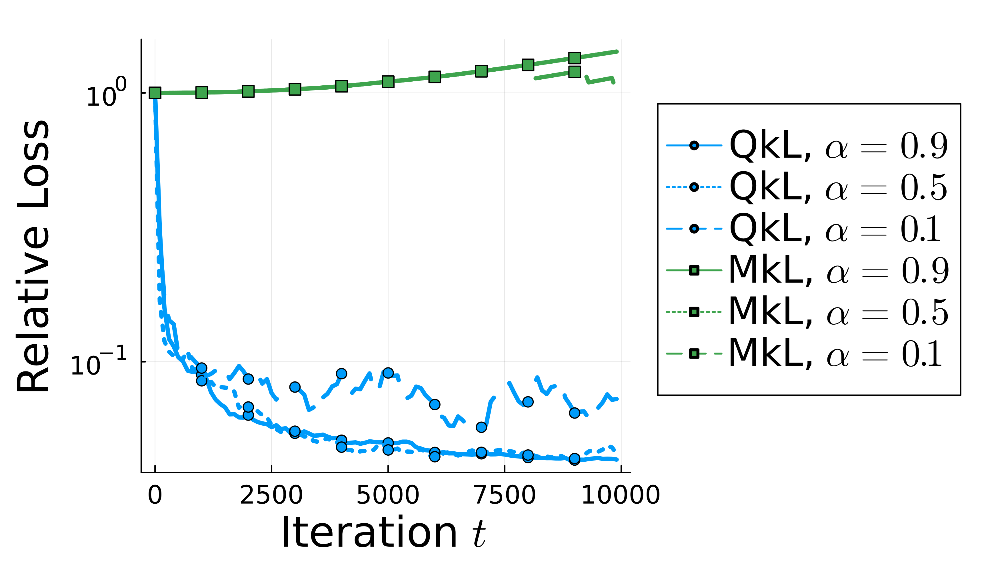

"/Users/jamiehaddock/Dropbox/RESEARCH/COLLAB CorruptSGD/code/JuliaCode/figs/hingeloss_loss_varyalpha_5percoutlier1class.png"

In [31]:
iters = 1:10000

# Plot loss curve
p = plot(iters[1:100:end],qkl_G_loss_hist9[1:100:end]/qkl_G_loss_hist9[1], label=nothing, xlabel=L"Iteration $t$", ylabel="Relative Loss", lw=3, dpi=500,margin=5mm,yscale=:log10,color=1,legend=:outerright,size = (700, 400))
scatter!(iters[1:1000:end],qkl_G_loss_hist9[1:1000:end]/qkl_G_loss_hist9[1], label=nothing, lw=3,yscale=:log10,color=1)
plot!(iters[1:100:end],qkl_G_loss_hist5[1:100:end]/qkl_G_loss_hist5[1], label=nothing, lw=3,yscale=:log10,color=1,linestyle=:dot)
scatter!(iters[1:1000:end],qkl_G_loss_hist5[1:1000:end]/qkl_G_loss_hist5[1], label=nothing, lw=3,yscale=:log10,color=1)
plot!(iters[1:100:end],qkl_G_loss_hist1[1:100:end]/qkl_G_loss_hist1[1], label=nothing, lw=3,yscale=:log10,color=1,linestyle=:dash)
scatter!(iters[1:1000:end],qkl_G_loss_hist1[1:1000:end]/qkl_G_loss_hist1[1], label=nothing, lw=3,yscale=:log10,color=1)
plot!(iters[1:100:end],mkl_G_loss_hist9[1:100:end]/mkl_G_loss_hist9[1], label=nothing, lw=3,yscale=:log10,color=3)
scatter!(iters[1:1000:end],mkl_G_loss_hist9[1:1000:end]/mkl_G_loss_hist9[1], label=nothing, lw=3,yscale=:log10,color=3,marker=:square)
plot!(iters[1:100:end],mkl_G_loss_hist5[1:100:end]/mkl_G_loss_hist5[1], label=nothing, lw=3,yscale=:log10,color=3,linestyle=:dot)
scatter!(iters[1:1000:end],mkl_G_loss_hist5[1:1000:end]/mkl_G_loss_hist5[1], label=nothing, lw=3,yscale=:log10,color=3,marker=:square)
plot!(iters[1:100:end],mkl_G_loss_hist1[1:100:end]/mkl_G_loss_hist1[1], label=nothing, lw=3,yscale=:log10,color=3,linestyle=:dash)
scatter!(iters[1:1000:end],mkl_G_loss_hist1[1:1000:end]/mkl_G_loss_hist1[1], label=nothing, lw=3,yscale=:log10,color=3,marker=:square)
# Burner plots (only for legend, thin lines)
plot!([NaN], [NaN], label=L"QkL, $\alpha = 0.9$", linestyle=:solid, lw=0.6, color=1,marker=:circle)
plot!([NaN], [NaN], label=L"QkL, $\alpha = 0.5$", linestyle=:dot, lw=0.6, color=1,marker=:circle)
plot!([NaN], [NaN], label=L"QkL, $\alpha = 0.1$", linestyle=:dash, lw=0.6, color=1,marker=:circle)
plot!([NaN], [NaN], label=L"MkL, $\alpha = 0.9$", linestyle=:solid, lw=0.6, color=3,marker=:square)
plot!([NaN], [NaN], label=L"MkL, $\alpha = 0.5$", linestyle=:dot, lw=0.6, color=3,marker=:square)
plot!([NaN], [NaN], label=L"MkL, $\alpha = 0.1$", linestyle=:dash, lw=0.6, color=3,marker=:square)

display(p)
savefig("figs/hingeloss_loss_varyalpha_5percoutlier1class.png")

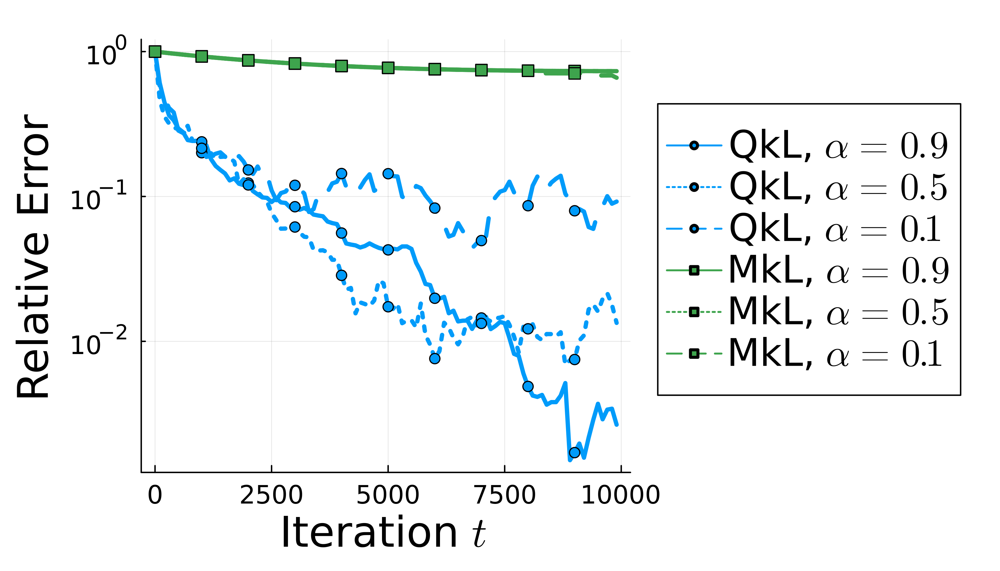

"/Users/jamiehaddock/Dropbox/RESEARCH/COLLAB CorruptSGD/code/JuliaCode/figs/hingeloss_error_varyalpha_5percoutlier1class.png"

In [32]:
iters = 1:10000

# Plot errors
p = plot(iters[1:100:end],qklsgd_error9[1:100:end]/qklsgd_error9[1], label=nothing, xlabel=L"Iteration $t$", ylabel="Relative Error", lw=3, dpi=500,margin=5mm,yscale=:log10,color=1,legend=:outerright,size = (700, 400))
scatter!(iters[1:1000:end],qklsgd_error9[1:1000:end]/qklsgd_error9[1], label=nothing, lw=3,yscale=:log10,color=1)
plot!(iters[1:100:end],qklsgd_error5[1:100:end]/qklsgd_error5[1], label=nothing, lw=3,yscale=:log10,color=1,linestyle=:dot)
scatter!(iters[1:1000:end],qklsgd_error5[1:1000:end]/qklsgd_error5[1], label=nothing, lw=3,yscale=:log10,color=1)
plot!(iters[1:100:end],qklsgd_error1[1:100:end]/qklsgd_error1[1], label=nothing, lw=3,yscale=:log10,color=1,linestyle=:dash)
scatter!(iters[1:1000:end],qklsgd_error1[1:1000:end]/qklsgd_error1[1], label=nothing, lw=3,yscale=:log10,color=1)
plot!(iters[1:100:end],mklsgd_error9[1:100:end]/mklsgd_error9[1], label=nothing, lw=3,yscale=:log10,color=3)
scatter!(iters[1:1000:end],mklsgd_error9[1:1000:end]/mklsgd_error9[1], label=nothing, lw=3,yscale=:log10,color=3,marker=:square)
plot!(iters[1:100:end],mklsgd_error5[1:100:end]/mklsgd_error5[1], label=nothing, lw=3,yscale=:log10,color=3,linestyle=:dot)
scatter!(iters[1:1000:end],mklsgd_error5[1:1000:end]/mklsgd_error5[1], label=nothing, lw=3,yscale=:log10,color=3,marker=:square)
plot!(iters[1:100:end],mklsgd_error1[1:100:end]/mklsgd_error1[1], label=nothing, lw=3,yscale=:log10,color=3,linestyle=:dash)
scatter!(iters[1:1000:end],mklsgd_error1[1:1000:end]/mklsgd_error1[1], label=nothing, lw=3,yscale=:log10,color=3,marker=:square)
# Burner plots (only for legend, thin lines)
plot!([NaN], [NaN], label=L"QkL, $\alpha = 0.9$", linestyle=:solid, lw=0.6, color=1,marker=:circle)
plot!([NaN], [NaN], label=L"QkL, $\alpha = 0.5$", linestyle=:dot, lw=0.6, color=1,marker=:circle)
plot!([NaN], [NaN], label=L"QkL, $\alpha = 0.1$", linestyle=:dash, lw=0.6, color=1,marker=:circle)
plot!([NaN], [NaN], label=L"MkL, $\alpha = 0.9$", linestyle=:solid, lw=0.6, color=3,marker=:square)
plot!([NaN], [NaN], label=L"MkL, $\alpha = 0.5$", linestyle=:dot, lw=0.6, color=3,marker=:square)
plot!([NaN], [NaN], label=L"MkL, $\alpha = 0.1$", linestyle=:dash, lw=0.6, color=3,marker=:square)

display(p)
savefig("figs/hingeloss_error_varyalpha_5percoutlier1class.png")

## Very small sample size

In [33]:
# Train model with QkL-SGD
qklsgd_x, qkl_G_loss_hist, O_loss_hist, indices, O_allowed, qklsgd_error = qklsgd_hingeloss(x0, D_aug, t, 200, 0.95, Gset, Oset, iters=10000, xstar = Gsgd_x)

# Train model with MkL-SGD
mklsgd_x, mkl_G_loss_hist2, O_loss_hist, indices, O_allowed, mklsgd_error2 = mklsgd_hingeloss(x0, D_aug, t, 2, Gset, Oset, iters=1000000, xstar = Gsgd_x)
mklsgd_x, mkl_G_loss_hist5, O_loss_hist, indices, O_allowed, mklsgd_error5 = mklsgd_hingeloss(x0, D_aug, t, 5, Gset, Oset, iters=400000, xstar = Gsgd_x)
mklsgd_x, mkl_G_loss_hist10, O_loss_hist, indices, O_allowed, mklsgd_error10 = mklsgd_hingeloss(x0, D_aug, t, 10, Gset, Oset, iters=200000, xstar = Gsgd_x)

(190,)
(2,)
(4,)
(5,)


([-0.007020717220791816, 0.22908113942922909, 0.28744568522051794], [69.49676050808286, 69.49666879164555, 69.4965771127864, 69.49648547149619, 69.49639386776542, 69.49630230158463, 69.4962107729444, 69.49611928183526, 69.49602782824783, 69.49593641217271  …  27.534005342836515, 27.53993901069235, 27.5458720877676, 27.5518045741208, 27.55773646981053, 27.563667774895343, 27.56959848943377, 27.575528613484334, 27.581458147105593, 27.58738709035606], [19.06769103696579, 19.06667683119264, 19.065662728327325, 19.064648728359263, 19.06363483127786, 19.06262103707253, 19.061607345732693, 19.060593757247766, 19.059580271607164, 19.0585668888003  …  19.06957313225425, 19.068665497893388, 19.06775795443136, 19.06685050185906, 19.065943140167363, 19.06503586934716, 19.064128689389328, 19.063221600284763, 19.062314602024347, 19.06140769459897], [189, 50, 148, 150, 51, 26, 130, 200, 126, 156  …  137, 158, 167, 137, 131, 51, 75, 122, 148, 16], [0, 0, 0, 0, 0, 0, 0, 0, 0, 0  …  0, 0, 0, 0, 0, 0, 0,

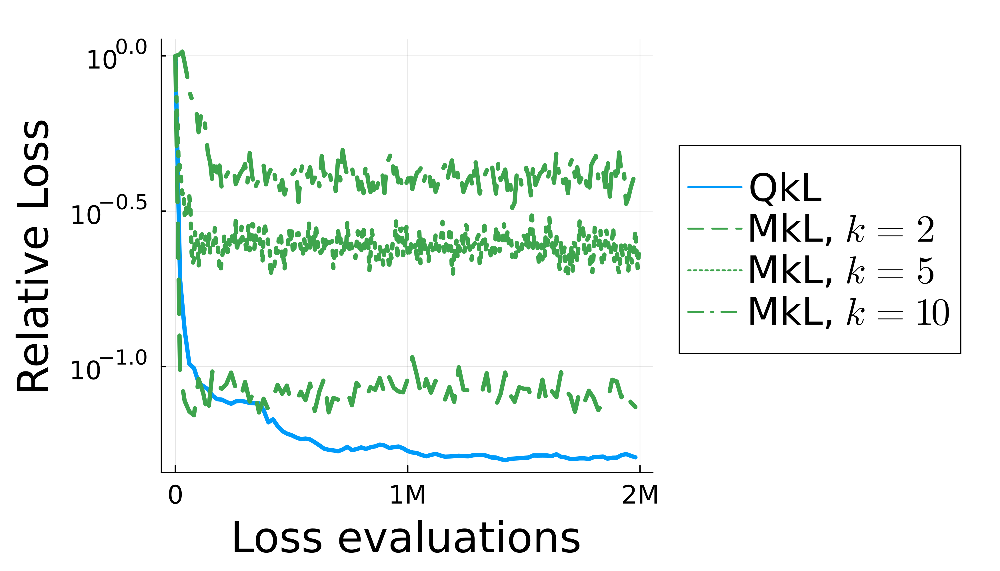

"/Users/jamiehaddock/Dropbox/RESEARCH/COLLAB CorruptSGD/code/JuliaCode/figs/hingeloss_loss_smallk_5percoutlier1class.png"

In [34]:
iters = 1:10000

# Plot loss curve
p = plot(200*iters[1:100:end],qkl_G_loss_hist[1:100:end]/qkl_G_loss_hist[1], label=nothing, xlabel="Loss evaluations", ylabel="Relative Loss", lw=3, dpi=500,margin=5mm,yscale=:log10,color=1,legend=:outerright,size = (700, 400))
iters = 1:1000000
plot!(2*iters[1:10000:end],mkl_G_loss_hist2[1:10000:end]/mkl_G_loss_hist2[1], label=nothing, lw=3,yscale=:log10,color=3,linestyle=:dash)
iters = 1:400000
plot!(5*iters[1:1000:end],mkl_G_loss_hist5[1:1000:end]/mkl_G_loss_hist5[1], label=nothing, lw=3,yscale=:log10,color=3,linestyle=:dot)
iters = 1:200000
plot!(10*iters[1:1000:end],mkl_G_loss_hist10[1:1000:end]/mkl_G_loss_hist10[1], label=nothing, lw=3,yscale=:log10,color=3,linestyle=:dashdot)
xticks!([0,1000000,2000000],["0","1M","2M"])
# Burner plots (only for legend, thin lines)
plot!([NaN], [NaN], label="QkL", linestyle=:solid, lw=0.6, color=1)
plot!([NaN], [NaN], label=L"MkL, $k = 2$", linestyle=:dash, lw=0.6, color=3)
plot!([NaN], [NaN], label=L"MkL, $k = 5$", linestyle=:dot, lw=0.6, color=3)
plot!([NaN], [NaN], label=L"MkL, $k = 10$", linestyle=:dashdot, lw=0.6, color=3)

display(p)
savefig("figs/hingeloss_loss_smallk_5percoutlier1class.png")

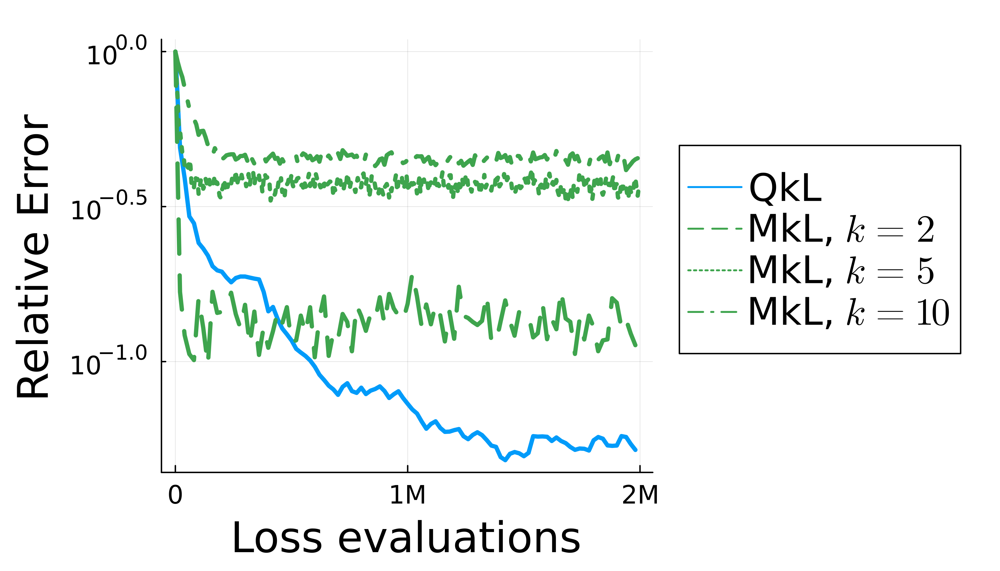

"/Users/jamiehaddock/Dropbox/RESEARCH/COLLAB CorruptSGD/code/JuliaCode/figs/hingeloss_error_smallk_5percoutlier1class.png"

In [35]:
iters = 1:10000

# Plot errors
p = plot(200*iters[1:100:end],qklsgd_error[1:100:end]/qklsgd_error[1], label=nothing, xlabel="Loss evaluations", ylabel="Relative Error", lw=3, dpi=500,margin=5mm,yscale=:log10,color=1,legend=:outerright,size = (700, 400))
iters = 1:1000000
plot!(2*iters[1:10000:end],mklsgd_error2[1:10000:end]/mklsgd_error2[1], label=nothing, lw=3,yscale=:log10,color=3,linestyle=:dash)
iters = 1:400000
plot!(5*iters[1:1000:end],mklsgd_error5[1:1000:end]/mklsgd_error5[1], label=nothing, lw=3,yscale=:log10,color=3,linestyle=:dot)
iters = 1:200000
plot!(10*iters[1:1000:end],mklsgd_error10[1:1000:end]/mklsgd_error10[1], label=nothing, lw=3,yscale=:log10,color=3,linestyle=:dashdot)
xticks!([0,1000000,2000000],["0","1M","2M"])

# Burner plots (only for legend, thin lines)
plot!([NaN], [NaN], label="QkL", linestyle=:solid, lw=0.6, color=1)
plot!([NaN], [NaN], label=L"MkL, $k = 2$", linestyle=:dash, lw=0.6, color=3)
plot!([NaN], [NaN], label=L"MkL, $k = 5$", linestyle=:dot, lw=0.6, color=3)
plot!([NaN], [NaN], label=L"MkL, $k = 10$", linestyle=:dashdot, lw=0.6, color=3)

display(p)
savefig("figs/hingeloss_error_smallk_5percoutlier1class.png")

# Sample size vs Final Relative Error

In [36]:
# run SGD on problem defined only by good set
Gsgd_x, loss_hist, loss_hist, indices, O_allowed = qklsgd_hingeloss(x0, D_aug[:,Gset], t[Gset], length(Gset), 1.0, 1:length(Gset), [], iters=100000)

num_trials = 100
alphas = [0.05, 0.1, 0.2, 0.3, 0.4, 0.5, 0.6, 0.7, 0.8, 0.9, 0.95, 1.0]
num_alphas = length(alphas)

qkl_relative_errors = zeros(num_trials, num_alphas)
mkl_relative_errors = zeros(num_trials, num_alphas)
qkl_relative_losses = zeros(num_trials, num_alphas)
mkl_relative_losses = zeros(num_trials, num_alphas)

iters = 10000
for trial = 1:num_trials

    alpha = 1.0
    # Train model with QkL-SGD
    qklsgd_x, qkl_G_loss_hist10, O_loss_hist, indices, O_allowed, qklsgd_error10 = qklsgd_hingeloss(x0, D_aug, t, Int(alpha*200), 0.95, Gset, Oset, iters=10000, xstar = Gsgd_x)

    # Train model with MkL-SGD
    mklsgd_x, mkl_G_loss_hist10, O_loss_hist, indices, O_allowed, mklsgd_error10 = mklsgd_hingeloss(x0, D_aug, t, Int(alpha*200), Gset, Oset, iters=10000, xstar = Gsgd_x)

    alpha = 0.95
    # Train model with QkL-SGD
    qklsgd_x, qkl_G_loss_hist95, O_loss_hist, indices, O_allowed, qklsgd_error95 = qklsgd_hingeloss(x0, D_aug, t, Int(alpha*200), 0.95, Gset, Oset, iters=10000, xstar = Gsgd_x)

    # Train model with MkL-SGD
    mklsgd_x, mkl_G_loss_hist95, O_loss_hist, indices, O_allowed, mklsgd_error95 = mklsgd_hingeloss(x0, D_aug, t, Int(alpha*200), Gset, Oset, iters=10000, xstar = Gsgd_x)

    alpha = 0.9
    # Train model with QkL-SGD
    qklsgd_x, qkl_G_loss_hist9, O_loss_hist, indices, O_allowed, qklsgd_error9 = qklsgd_hingeloss(x0, D_aug, t, Int(alpha*200), 0.95, Gset, Oset, iters=10000, xstar = Gsgd_x)

    # Train model with MkL-SGD
    mklsgd_x, mkl_G_loss_hist9, O_loss_hist, indices, O_allowed, mklsgd_error9 = mklsgd_hingeloss(x0, D_aug, t, Int(alpha*200), Gset, Oset, iters=10000, xstar = Gsgd_x)

    alpha = 0.8
    # Train model with QkL-SGD
    qklsgd_x, qkl_G_loss_hist8, O_loss_hist, indices, O_allowed, qklsgd_error8 = qklsgd_hingeloss(x0, D_aug, t, Int(alpha*200), 0.95, Gset, Oset, iters=10000, xstar = Gsgd_x)

    # Train model with MkL-SGD
    mklsgd_x, mkl_G_loss_hist8, O_loss_hist, indices, O_allowed, mklsgd_error8 = mklsgd_hingeloss(x0, D_aug, t, Int(alpha*200), Gset, Oset, iters=10000, xstar = Gsgd_x)

    alpha = 0.7
    # Train model with QkL-SGD
    qklsgd_x, qkl_G_loss_hist7, O_loss_hist, indices, O_allowed, qklsgd_error7 = qklsgd_hingeloss(x0, D_aug, t, Int(alpha*200), 0.95, Gset, Oset, iters=10000, xstar = Gsgd_x)

    # Train model with MkL-SGD
    mklsgd_x, mkl_G_loss_hist7, O_loss_hist, indices, O_allowed, mklsgd_error7 = mklsgd_hingeloss(x0, D_aug, t, Int(alpha*200), Gset, Oset, iters=10000, xstar = Gsgd_x)

    alpha = 0.6
    # Train model with QkL-SGD
    qklsgd_x, qkl_G_loss_hist6, O_loss_hist, indices, O_allowed, qklsgd_error6 = qklsgd_hingeloss(x0, D_aug, t, Int(alpha*200), 0.95, Gset, Oset, iters=10000, xstar = Gsgd_x)

    # Train model with MkL-SGD
    mklsgd_x, mkl_G_loss_hist6, O_loss_hist, indices, O_allowed, mklsgd_error6 = mklsgd_hingeloss(x0, D_aug, t, Int(alpha*200), Gset, Oset, iters=10000, xstar = Gsgd_x)

    alpha = 0.5
    # Train model with QkL-SGD
    qklsgd_x, qkl_G_loss_hist5, O_loss_hist, indices, O_allowed, qklsgd_error5 = qklsgd_hingeloss(x0, D_aug, t, Int(alpha*200), 0.95, Gset, Oset, iters=10000, xstar = Gsgd_x)

    # Train model with MkL-SGD
    mklsgd_x, mkl_G_loss_hist5, O_loss_hist, indices, O_allowed, mklsgd_error5 = mklsgd_hingeloss(x0, D_aug, t, Int(alpha*200), Gset, Oset, iters=10000, xstar = Gsgd_x)

    alpha = 0.4
    # Train model with QkL-SGD
    qklsgd_x, qkl_G_loss_hist4, O_loss_hist, indices, O_allowed, qklsgd_error4 = qklsgd_hingeloss(x0, D_aug, t, Int(alpha*200), 0.95, Gset, Oset, iters=10000, xstar = Gsgd_x)

    # Train model with MkL-SGD
    mklsgd_x, mkl_G_loss_hist4, O_loss_hist, indices, O_allowed, mklsgd_error4 = mklsgd_hingeloss(x0, D_aug, t, Int(alpha*200), Gset, Oset, iters=10000, xstar = Gsgd_x)

    alpha = 0.3
    # Train model with QkL-SGD
    qklsgd_x, qkl_G_loss_hist3, O_loss_hist, indices, O_allowed, qklsgd_error3 = qklsgd_hingeloss(x0, D_aug, t, Int(alpha*200), 0.95, Gset, Oset, iters=10000, xstar = Gsgd_x)

    # Train model with MkL-SGD
    mklsgd_x, mkl_G_loss_hist3, O_loss_hist, indices, O_allowed, mklsgd_error3 = mklsgd_hingeloss(x0, D_aug, t, Int(alpha*200), Gset, Oset, iters=10000, xstar = Gsgd_x)

    alpha = 0.2
    # Train model with QkL-SGD
    qklsgd_x, qkl_G_loss_hist2, O_loss_hist, indices, O_allowed, qklsgd_error2 = qklsgd_hingeloss(x0, D_aug, t, Int(alpha*200), 0.95, Gset, Oset, iters=10000, xstar = Gsgd_x)

    # Train model with MkL-SGD
    mklsgd_x, mkl_G_loss_hist2, O_loss_hist, indices, O_allowed, mklsgd_error2 = mklsgd_hingeloss(x0, D_aug, t, Int(alpha*200), Gset, Oset, iters=10000, xstar = Gsgd_x)

    alpha = 0.1
    # Train model with QkL-SGD
    qklsgd_x, qkl_G_loss_hist1, O_loss_hist, indices, O_allowed, qklsgd_error1 = qklsgd_hingeloss(x0, D_aug, t, Int(alpha*200), 0.95, Gset, Oset, iters=10000, xstar = Gsgd_x)

    # Train model with MkL-SGD
    mklsgd_x, mkl_G_loss_hist1, O_loss_hist, indices, O_allowed, mklsgd_error1 = mklsgd_hingeloss(x0, D_aug, t, Int(alpha*200), Gset, Oset, iters=10000, xstar = Gsgd_x)

    alpha = 0.05
    # Train model with QkL-SGD
    qklsgd_x, qkl_G_loss_hist05, O_loss_hist, indices, O_allowed, qklsgd_error05 = qklsgd_hingeloss(x0, D_aug, t, Int(alpha*200), 0.95, Gset, Oset, iters=10000, xstar = Gsgd_x)

    # Train model with MkL-SGD
    mklsgd_x, mkl_G_loss_hist05, O_loss_hist, indices, O_allowed, mklsgd_error05 = mklsgd_hingeloss(x0, D_aug, t, Int(alpha*200), Gset, Oset, iters=10000, xstar = Gsgd_x)

    qkl_relative_losses[trial,:] = [qkl_G_loss_hist05[iters]/qkl_G_loss_hist05[1], qkl_G_loss_hist1[iters]/qkl_G_loss_hist1[1], qkl_G_loss_hist2[iters]/qkl_G_loss_hist2[1], qkl_G_loss_hist3[iters]/qkl_G_loss_hist3[1], qkl_G_loss_hist4[iters]/qkl_G_loss_hist4[1], qkl_G_loss_hist5[iters]/qkl_G_loss_hist5[1], qkl_G_loss_hist6[iters]/qkl_G_loss_hist6[1], qkl_G_loss_hist7[iters]/qkl_G_loss_hist7[1], qkl_G_loss_hist8[iters]/qkl_G_loss_hist8[1], qkl_G_loss_hist9[iters]/qkl_G_loss_hist9[1], qkl_G_loss_hist95[iters]/qkl_G_loss_hist95[1], qkl_G_loss_hist10[iters]/qkl_G_loss_hist10[1]]
    mkl_relative_losses[trial,:] = [mkl_G_loss_hist05[iters]/mkl_G_loss_hist05[1], mkl_G_loss_hist1[iters]/mkl_G_loss_hist1[1], mkl_G_loss_hist2[iters]/mkl_G_loss_hist2[1], mkl_G_loss_hist3[iters]/mkl_G_loss_hist3[1], mkl_G_loss_hist4[iters]/mkl_G_loss_hist4[1], mkl_G_loss_hist5[iters]/mkl_G_loss_hist5[1], mkl_G_loss_hist6[iters]/mkl_G_loss_hist6[1], mkl_G_loss_hist7[iters]/mkl_G_loss_hist7[1], mkl_G_loss_hist8[iters]/mkl_G_loss_hist8[1], mkl_G_loss_hist9[iters]/mkl_G_loss_hist9[1], mkl_G_loss_hist95[iters]/mkl_G_loss_hist95[1], mkl_G_loss_hist10[iters]/mkl_G_loss_hist10[1]]

    qkl_relative_errors[trial,:] = [qklsgd_error05[iters]/qklsgd_error05[1], qklsgd_error1[iters]/qklsgd_error1[1], qklsgd_error2[iters]/qklsgd_error2[1], qklsgd_error3[iters]/qklsgd_error3[1], qklsgd_error4[iters]/qklsgd_error4[1], qklsgd_error5[iters]/qklsgd_error5[1], qklsgd_error6[iters]/qklsgd_error6[1], qklsgd_error7[iters]/qklsgd_error7[1], qklsgd_error8[iters]/qklsgd_error8[1], qklsgd_error9[iters]/qklsgd_error9[1], qklsgd_error95[iters]/qklsgd_error95[1], qklsgd_error10[iters]/qklsgd_error10[1]]
    mkl_relative_errors[trial,:] = [mklsgd_error05[iters]/mklsgd_error05[1], mklsgd_error1[iters]/mklsgd_error1[1], mklsgd_error2[iters]/mklsgd_error2[1], mklsgd_error3[iters]/mklsgd_error3[1], mklsgd_error4[iters]/mklsgd_error4[1], mklsgd_error5[iters]/mklsgd_error5[1], mklsgd_error6[iters]/mklsgd_error6[1], mklsgd_error7[iters]/mklsgd_error7[1], mklsgd_error8[iters]/mklsgd_error8[1], mklsgd_error9[iters]/mklsgd_error9[1], mklsgd_error95[iters]/mklsgd_error95[1], mklsgd_error10[iters]/mklsgd_error10[1]]
end

(191,)
(190,)
(31,)
(180,)
(31,)
(171,)
(31,)
(152,)
(26,)
(133,)
(16,)
(114,)
(17,)
(95,)
(16,)
(76,)
(8,)
(57,)
(10,)
(38,)
(5,)
(19,)
(6,)
(9,)
(2,)
(190,)
(31,)
(180,)
(30,)
(171,)
(26,)
(152,)
(25,)
(133,)
(25,)
(114,)
(18,)
(95,)
(14,)
(76,)
(17,)
(57,)
(11,)
(40,)
(8,)
(20,)
(3,)
(10,)
(8,)
(190,)
(31,)
(180,)
(30,)
(171,)
(29,)
(152,)
(25,)
(133,)
(24,)
(114,)
(17,)
(95,)
(13,)
(76,)
(20,)
(58,)
(15,)
(38,)
(11,)
(19,)
(4,)
(9,)
(3,)
(190,)
(31,)
(180,)
(28,)
(171,)
(27,)
(152,)
(23,)
(133,)
(23,)
(114,)
(15,)
(95,)
(12,)
(76,)
(14,)
(57,)
(8,)
(38,)
(7,)
(19,)
(6,)
(9,)
(6,)
(190,)
(31,)
(180,)
(29,)
(171,)
(30,)
(152,)
(23,)
(133,)
(19,)
(114,)
(18,)
(95,)
(14,)
(76,)
(16,)
(57,)
(8,)
(38,)
(3,)
(20,)
(9,)
(10,)
(1,)
(190,)
(31,)
(180,)
(30,)
(171,)
(29,)
(152,)
(22,)
(133,)
(18,)
(114,)
(14,)
(95,)
(15,)
(76,)
(10,)
(57,)
(8,)
(38,)
(8,)
(19,)
(3,)
(10,)
(4,)
(190,)
(31,)
(180,)
(30,)
(171,)
(27,)
(152,)
(27,)
(133,)
(22,)
(114,)
(19,)
(95,)
(15,)
(76,)
(12,)
(57,)
(11,)
(38

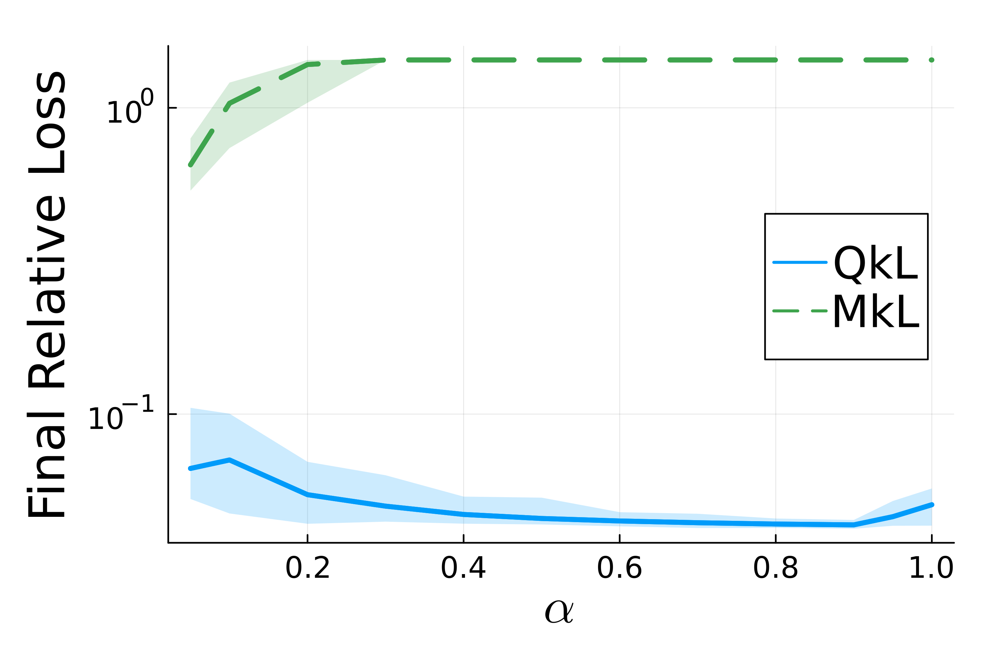

"/Users/jamiehaddock/Dropbox/RESEARCH/COLLAB CorruptSGD/code/JuliaCode/figs/hingeloss_loss_vs_alpha_5percoutlier.png"

In [37]:
p = plot(alphas, vec(mean(qkl_relative_losses, dims=1)), fillrange = vec(maximum(qkl_relative_losses, dims=1)), fillalpha = 0.2, label=nothing, xlabel=L"$\alpha$", ylabel="Final Relative Loss", lw=3, dpi=500,margin=5mm,color=1,legend=:right,yscale=:log10)
plot!(alphas, vec(mean(qkl_relative_losses, dims=1)), fillrange = vec(minimum(qkl_relative_losses, dims=1)), fillalpha = 0.2, label=nothing, lw=3, color=1,yscale=:log10)
plot!(alphas, vec(mean(mkl_relative_losses, dims=1)), fillrange = vec(maximum(mkl_relative_losses, dims=1)), fillalpha = 0.2, label=nothing, lw=3, color=3,linestyle=:dash,yscale=:log10)
plot!(alphas, vec(mean(mkl_relative_losses, dims=1)), fillrange = vec(minimum(mkl_relative_losses, dims=1)), fillalpha = 0.2, label=nothing, lw=3, color=3,linestyle=:dash,yscale=:log10)
# Burner plots (only for legend, thin lines)
plot!([NaN], [NaN], label="QkL", linestyle=:solid, lw=0.8, color=1)
plot!([NaN], [NaN], label="MkL", linestyle=:dash, lw=0.8, color=3)

display(p)
savefig("figs/hingeloss_loss_vs_alpha_5percoutlier.png")

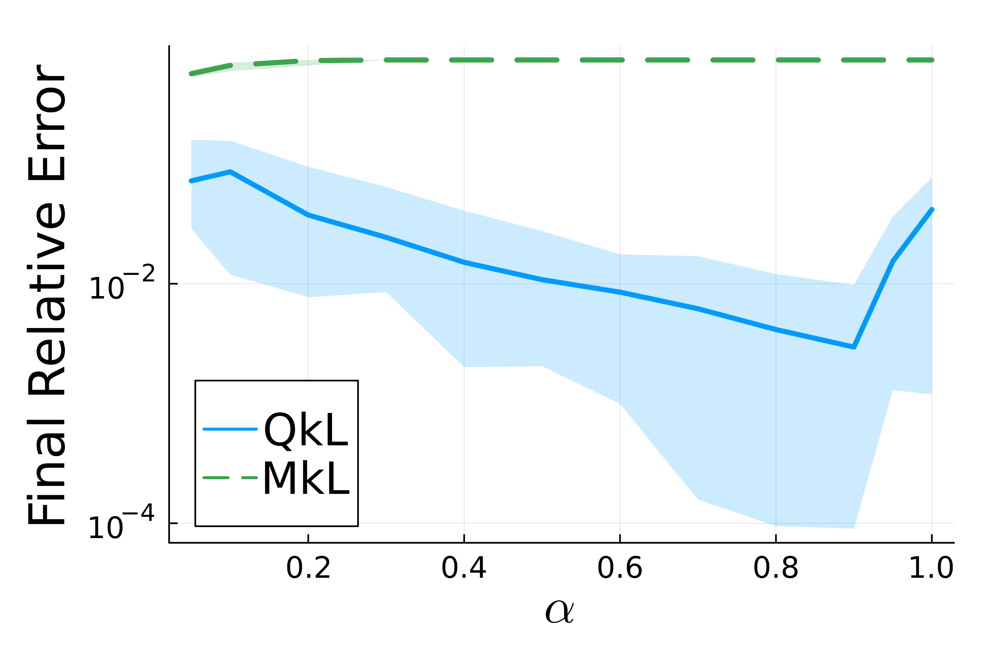

"/Users/jamiehaddock/Dropbox/RESEARCH/COLLAB CorruptSGD/code/JuliaCode/figs/hingeloss_error_vs_alpha_5percoutlier.png"

In [38]:
p = plot(alphas, vec(mean(qkl_relative_errors, dims=1)), fillrange = vec(maximum(qkl_relative_errors, dims=1)), fillalpha = 0.2, label=nothing, xlabel=L"$\alpha$", ylabel="Final Relative Error", lw=3, dpi=500,margin=5mm,color=1,legend=:bottomleft,yscale=:log10)
plot!(alphas, vec(mean(qkl_relative_errors, dims=1)), fillrange = vec(minimum(qkl_relative_errors, dims=1)), fillalpha = 0.2, label=nothing, lw=3, color=1,yscale=:log10)
plot!(alphas, vec(mean(mkl_relative_errors, dims=1)), fillrange = vec(maximum(mkl_relative_errors, dims=1)), fillalpha = 0.2, label=nothing, lw=3, color=3,linestyle=:dash,yscale=:log10)
plot!(alphas, vec(mean(mkl_relative_errors, dims=1)), fillrange = vec(minimum(mkl_relative_errors, dims=1)), fillalpha = 0.2, label=nothing, lw=3, color=3,linestyle=:dash,yscale=:log10)
# Burner plots (only for legend, thin lines)
plot!([NaN], [NaN], label="QkL", linestyle=:solid, lw=0.8, color=1)
plot!([NaN], [NaN], label="MkL", linestyle=:dash, lw=0.8, color=3)

display(p)
savefig("figs/hingeloss_error_vs_alpha_5percoutlier.png")

# Quantile vs Final Relative Error

In [39]:
betas = [0.1, 0.2, 0.3, 0.4]
qs = 0.05:0.05:1.0

final_errs = zeros(length(betas), length(qs))
final_losses = zeros(length(betas), length(qs))

num_trials = 100

for (j,β) in enumerate(betas)
    # reset labels
	t = vcat(ones(class_size), -ones(class_size))  # Labels: 1 for positive, -1 for negative
	Oset = rand(1:Int(n_samples/2), Int(β*n_samples))  # Randomly select Oset indices
    t[Oset] .= -t[Oset]  # Flip labels
    Gset = setdiff(1:n_samples, Oset);  # Gset is the complement of Oset

    errs = zeros(num_trials, length(qs))
    losses = zeros(num_trials, length(qs))
    for trial = 1:num_trials
        for (i,q) in enumerate(qs)
            # Train model with QkL-SGD
            qklsgd_x, qkl_G_loss_hist, O_loss_hist, indices, O_allowed, qklsgd_error = qklsgd_hingeloss(x0, D_aug, t, n_samples, q, Gset, Oset, iters=10000, xstar = Gsgd_x)
            errs[trial, i] = qklsgd_error[end]/qklsgd_error[1]
            losses[trial, i] = qkl_G_loss_hist[end]/qkl_G_loss_hist[1]
        end
    end
    final_errs[j, :] = vec(mean(errs, dims=1))
    final_losses[j, :] = vec(mean(losses, dims=1))
end

(26,)
(26,)
(40,)
(51,)
(52,)
(60,)
(76,)
(83,)
(98,)
(100,)
(111,)
(123,)
(130,)
(140,)
(153,)
(160,)
(170,)
(180,)
(190,)
(200,)
(26,)
(26,)
(40,)
(52,)
(56,)
(62,)
(73,)
(86,)
(97,)
(106,)
(114,)
(124,)
(132,)
(140,)
(152,)
(160,)
(170,)
(180,)
(190,)
(200,)
(26,)
(26,)
(40,)
(53,)
(52,)
(63,)
(72,)
(82,)
(94,)
(102,)
(113,)
(120,)
(130,)
(142,)
(150,)
(160,)
(170,)
(180,)
(190,)
(200,)
(26,)
(26,)
(40,)
(51,)
(59,)
(60,)
(76,)
(85,)
(91,)
(105,)
(111,)
(123,)
(131,)
(140,)
(151,)
(160,)
(170,)
(180,)
(190,)
(200,)
(26,)
(26,)
(40,)
(52,)
(59,)
(62,)
(73,)
(82,)
(91,)
(100,)
(111,)
(122,)
(130,)
(140,)
(152,)
(161,)
(170,)
(180,)
(190,)
(200,)
(26,)
(26,)
(40,)
(53,)
(59,)
(68,)
(72,)
(99,)
(104,)
(100,)
(113,)
(123,)
(131,)
(140,)
(153,)
(160,)
(170,)
(180,)
(190,)
(200,)
(26,)
(26,)
(40,)
(51,)
(52,)
(60,)
(72,)
(80,)
(90,)
(101,)
(112,)
(125,)
(131,)
(140,)
(150,)
(160,)
(170,)
(180,)
(190,)
(200,)
(26,)
(26,)
(40,)
(52,)
(59,)
(60,)
(77,)
(87,)
(94,)
(101,)
(110,)
(123,)
(130,)


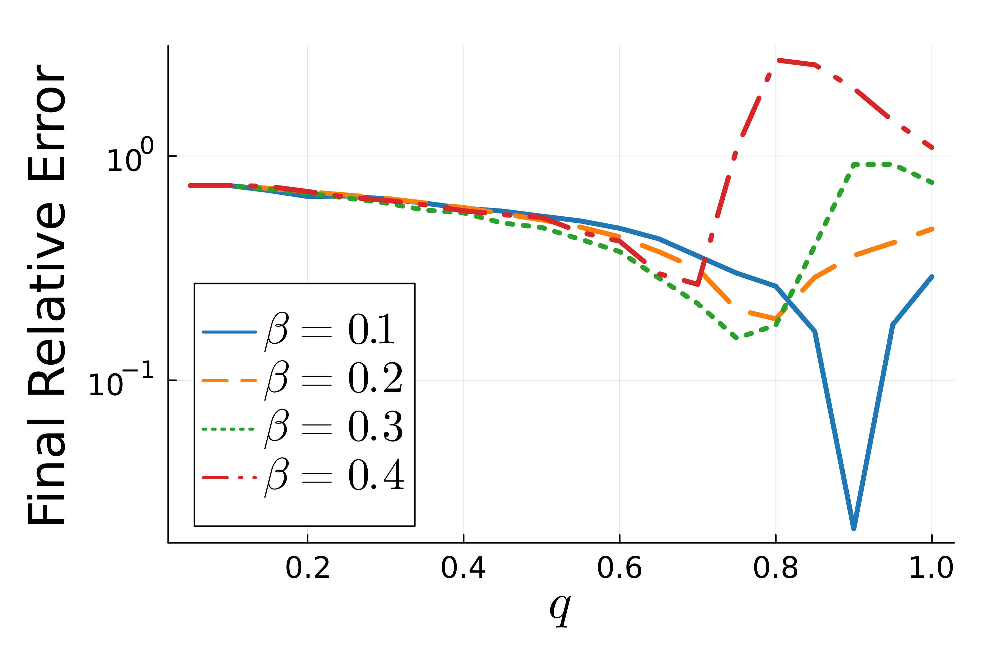

"/Users/jamiehaddock/Dropbox/RESEARCH/COLLAB CorruptSGD/code/JuliaCode/figs/hingeloss_error_vs_q.png"

In [40]:
colors = palette(:tab10)
linestyles = [:solid, :dash, :dot, :dashdot]

p = plot(
    xlabel=L"q",
    ylabel="Final Relative Error",
    lw=3,
    dpi=500,
    margin=5mm,
    legend=:bottomleft,
)

for (j, beta) in enumerate(betas)
    plot!(
        qs,
        final_errs[j, :],
        color=colors[j],
        linestyle=linestyles[j],
        label=nothing,
        yscale=:log10,
        lw=3
    )
    # Burner plots (only for legend, thin lines)
    plot!([NaN], [NaN], 
        color=colors[j],
        linestyle=linestyles[j],
        label=L"\beta = %$(beta)",
        lw=0.8
    )
end

display(p)
savefig("figs/hingeloss_error_vs_q.png")

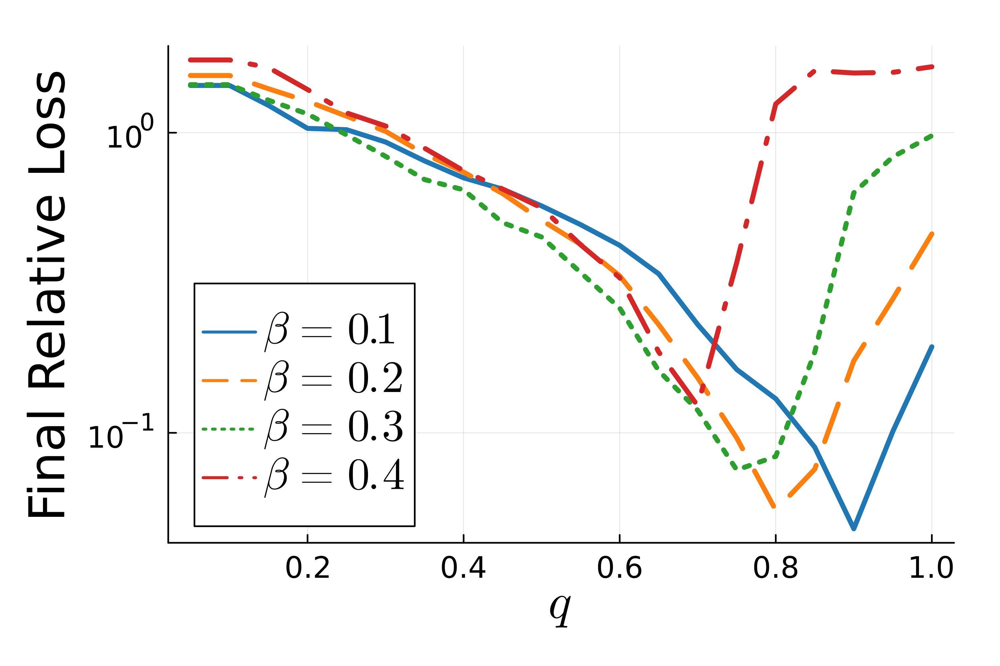

"/Users/jamiehaddock/Dropbox/RESEARCH/COLLAB CorruptSGD/code/JuliaCode/figs/hingeloss_loss_vs_q.png"

In [41]:
p = plot(
    xlabel=L"q",
    ylabel="Final Relative Loss",
    lw=3,
    dpi=500,
    margin=5mm,
    legend=:bottomleft,
)

for (j, beta) in enumerate(betas)
    plot!(
        qs,
        final_losses[j, :],
        color=colors[j],
        linestyle=linestyles[j],
        label=nothing,
        yscale=:log10,
        lw=3
    )
    # Burner plots (only for legend, thin lines)
    plot!([NaN], [NaN], 
        color=colors[j],
        linestyle=linestyles[j],
        label=L"\beta = %$(beta)",
        lw=0.8
    )
end

display(p)
savefig("figs/hingeloss_loss_vs_q.png")